##### Preprocessing:

- **Filtering**: Apply appropriate filters to remove noise and artifacts from the EEG signals. Common filters include bandpass, highpass, and notch filters.
- **Artifact Removal**: Use techniques such as Independent Component Analysis (ICA) or template matching to identify and remove artifacts such as eye blinks or muscle activity.
- **Resampling**: If needed, resample the EEG data to a lower or higher sampling rate to match the requirements of your analysis.
- **Baseline Correction**: Optionally, apply baseline correction to remove baseline drifts or shifts in the EEG signals.

##### Feature Extraction:

- **Time-Domain Features**: Compute statistical features such as mean, variance, skewness, and kurtosis for each EEG channel.
- **Frequency-Domain Features**: Compute power spectral density (PSD) using techniques like Fast Fourier Transform (FFT) or wavelet analysis.
- **Spatial Features**: Compute spatial features such as coherence or phase synchronization between EEG channels.
- **Event-Related Potentials (ERPs)**: If applicable, extract ERPs related to specific events or stimuli from the EEG data.

In [1]:
import os
import re
from collections import defaultdict
import mne
from typing import List, Tuple, Dict
from mne.io import read_raw, Raw, read_raw_fif 
from mne.preprocessing import ICA, read_ica, find_bad_channels_lof, create_eog_epochs
from mne import concatenate_raws, events_from_annotations, Epochs
import copy
import pathlib
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from pyprep.find_noisy_channels import NoisyChannels

In [2]:
baseInputPath = './Data/Offline EEG data'
# baseOutputPath = './Data/proceesed EEG data'
subjects = ['P01', 'P02', 'P03', 'P04', 'P05', 'P06', 'P07', 'P08', 'P09', 'P10']
attempted_movement_runs = ['Run 3', 'Run 4', 'Run 5', 'Run 6', 'Run 7', 'Run 10', 'Run 11', 'Run 12', 'Run 13']
participant_runs = defaultdict(list)

for subject in subjects:
    for run in attempted_movement_runs:
        file_path = f'{baseInputPath}/{subject}/{subject} {run}.gdf'

        try:
            rawEEG = read_raw(file_path, preload=True)
            rawEEG.set_channel_types({'eog-l': 'eog', 'eog-m': 'eog', 'eog-r': 'eog'})
            participant_runs[subject].append(rawEEG)
        except FileNotFoundError:
            print(f"File not found: {file_path}")

# Convert defaultdict to regular dictionary
eeg_raw_dict = dict(participant_runs)


Extracting EDF parameters from /Users/diegosabajo/Documents/Projects/A.I./Prototype/EEG_Analysis/Data/Offline EEG data/P01/P01 Run 3.gdf...
GDF file detected
Setting channel info structure...
Could not determine channel type of the following channels, they will be set as EEG:
AFz, F3, F1, Fz, F2, F4, FFC5h, FFC3h, FFC1h, FFC2h, FFC4h, FFC6h, FC5, FC3, FC1, FCz, FC2, FC4, FC6, FCC5h, FCC3h, FCC1h, FCC2h, FCC4h, FCC6h, C5, C3, C1, Cz, C2, C4, C6, CCP5h, CCP3h, CCP1h, CCP2h, CCP4h, CCP6h, CP5, CP3, CP1, CPz, CP2, CP4, CP6, CPP5h, CPP3h, CPP1h, CPP2h, CPP4h, CPP6h, P5, P3, P1, Pz, P2, P4, P6, PPO1h, PPO2h, POz, eog-l, eog-m, eog-r
Creating raw.info structure...
Reading 0 ... 75519  =      0.000 ...   294.996 secs...
Extracting EDF parameters from /Users/diegosabajo/Documents/Projects/A.I./Prototype/EEG_Analysis/Data/Offline EEG data/P01/P01 Run 4.gdf...
GDF file detected
Setting channel info structure...
Could not determine channel type of the following channels, they will be set as EEG:
A

In [2]:
def participant_runs(eeg_dict: dict[List], participant_id)-> List:
  participant_runs = eeg_dict.get(participant_id, [])
  return participant_runs

### Exploratory Data Analysis (EDA)

In [4]:
participant_01_runs = participant_runs(eeg_raw_dict, 'P01')

In [5]:
print(participant_01_runs[0].info['ch_names'])
participant_01_runs[0].info

['AFz', 'F3', 'F1', 'Fz', 'F2', 'F4', 'FFC5h', 'FFC3h', 'FFC1h', 'FFC2h', 'FFC4h', 'FFC6h', 'FC5', 'FC3', 'FC1', 'FCz', 'FC2', 'FC4', 'FC6', 'FCC5h', 'FCC3h', 'FCC1h', 'FCC2h', 'FCC4h', 'FCC6h', 'C5', 'C3', 'C1', 'Cz', 'C2', 'C4', 'C6', 'CCP5h', 'CCP3h', 'CCP1h', 'CCP2h', 'CCP4h', 'CCP6h', 'CP5', 'CP3', 'CP1', 'CPz', 'CP2', 'CP4', 'CP6', 'CPP5h', 'CPP3h', 'CPP1h', 'CPP2h', 'CPP4h', 'CPP6h', 'P5', 'P3', 'P1', 'Pz', 'P2', 'P4', 'P6', 'PPO1h', 'PPO2h', 'POz', 'eog-l', 'eog-m', 'eog-r']


Measurement date,"April 04, 2017 13:04:15 GMT"
Experimenter,Unknown
Participant,mit
Digitized points,Not available
Good channels,"61 EEG, 3 EOG"
Bad channels,None
EOG channels,"eog-l, eog-m, eog-r"
ECG channels,Not available
Sampling frequency,256.00 Hz
Highpass,0.00 Hz
Lowpass,128.00 Hz


In [6]:
# ssp_projectors =rawEEGList[0]['projs']
participant_01_runs[0].del_proj()

Measurement date,"April 04, 2017 13:04:15 GMT"
Experimenter,Unknown
Participant,mit
Digitized points,Not available
Good channels,"61 EEG, 3 EOG"
Bad channels,None
EOG channels,"eog-l, eog-m, eog-r"
ECG channels,Not available
Sampling frequency,256.00 Hz
Highpass,0.00 Hz
Lowpass,128.00 Hz


Effective window size : 8.000 (s)
Plotting power spectral density (dB=True).
ax Axes(0.125,0.11;0.775x0.77)


/Users/diegosabajo/miniconda3/envs/neural_ml/lib/python3.11/site-packages/mne/viz/utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


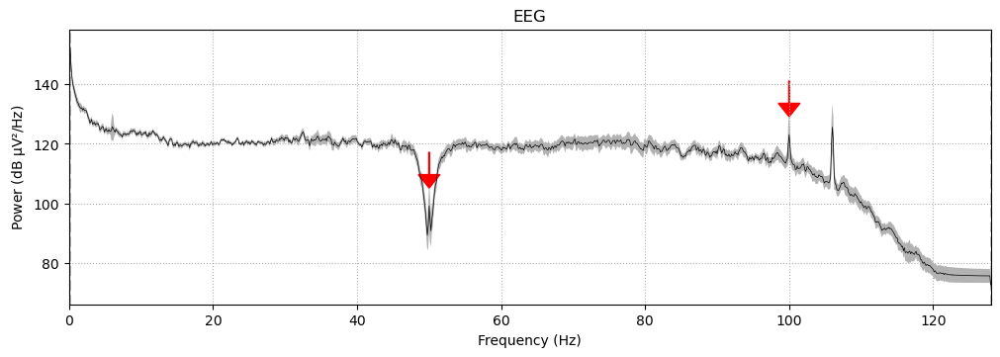

In [8]:
fig = participant_01_runs[0].compute_psd(tmax=np.inf, fmax=128).plot(average=True, amplitude=False,
                                                      picks='data', exclude='bads')
for ax in fig.axes:
  print('ax', ax)
  freqs = ax.lines[-1].get_xdata()
  psds = ax.lines[-1].get_ydata()
  for freq in (50, 100):
    idx = np.searchsorted(freqs, freq)
    ax.arrow(
      x = freqs[idx],
      y = psds[idx] + 18,
      dx = 0,
      dy = -12, 
      color = 'red',
      width = 0.1,
      head_width = 3,
      length_includes_head = True,
    )
plt.show()

In [9]:
def print_time(eegDataDict: dict[List]):
    total_time = []
    for participant_id, eegData in eegDataDict.items():
        print(f"Participant {participant_id}:")
        for i, rawEEG in enumerate(eegData):
            time = rawEEG.get_data().shape[1] / rawEEG.info['sfreq']
            total_time.append(time)
            print(f'  Run {i + 1} - Time(s):', time)
    print('Total time(h):', sum(total_time) / 3600)

print_time(eeg_raw_dict)


Participant P01:
  Run 1 - Time(s): 295.0
  Run 2 - Time(s): 299.0
  Run 3 - Time(s): 300.0
  Run 4 - Time(s): 297.0
  Run 5 - Time(s): 301.0
  Run 6 - Time(s): 304.0
  Run 7 - Time(s): 301.0
  Run 8 - Time(s): 304.0
  Run 9 - Time(s): 302.0
Participant P02:
  Run 1 - Time(s): 301.0
  Run 2 - Time(s): 304.0
  Run 3 - Time(s): 301.0
  Run 4 - Time(s): 304.0
  Run 5 - Time(s): 302.0
  Run 6 - Time(s): 308.0
  Run 7 - Time(s): 301.0
  Run 8 - Time(s): 302.0
  Run 9 - Time(s): 301.0
Participant P03:
  Run 1 - Time(s): 299.0
  Run 2 - Time(s): 300.0
  Run 3 - Time(s): 297.0
  Run 4 - Time(s): 301.0
  Run 5 - Time(s): 304.0
  Run 6 - Time(s): 301.0
  Run 7 - Time(s): 304.0
  Run 8 - Time(s): 302.0
  Run 9 - Time(s): 308.0
Participant P04:
  Run 1 - Time(s): 299.0
  Run 2 - Time(s): 300.0
  Run 3 - Time(s): 297.0
  Run 4 - Time(s): 301.0
  Run 5 - Time(s): 304.0
  Run 6 - Time(s): 304.0
  Run 7 - Time(s): 302.0
  Run 8 - Time(s): 308.0
  Run 9 - Time(s): 301.0
Participant P05:
  Run 1 - Time(

#### Checking for bad channels

In [11]:
# matplotlib.use('agg')
# %matplotlib qt 

participant_01_runs[0].plot(title='Raw EEG Data', block=False, scalings='50.0', color='black',
          )
plt.show()

2024-05-29 22:34:07,530 - OpenGL.acceleratesupport - INFO - No OpenGL_accelerate module loaded: No module named 'OpenGL_accelerate'


Using qt as 2D backend.
Using pyopengl with version 3.1.1a1


Channels marked as bad:
none


#### Checking for missing values in channels

In [12]:
import os
import numpy as np

def print_missing_values_per_run(rawEEGDict):
    for participant_id, rawEEGList in rawEEGDict.items():
        print(f"Participant {participant_id}:")
        for i, rawEEG in enumerate(rawEEGList):
            filename = os.path.basename(rawEEG.filenames[0])
            total_missing_values = np.isnan(rawEEG.get_data()).sum()
            shape = rawEEG.get_data().shape
            total_missing_values_per_channel = total_missing_values / shape[0]
            print(f'  Run {i + 1} - Filename: {filename}')
            print('    Total Missing Values:', total_missing_values)
            print('    Shape of data:', shape)
            print('    Total Missing Values per channel:', total_missing_values_per_channel)
            print('=========================')

print_missing_values_per_run(eeg_raw_dict)


Participant P01:
  Run 1 - Filename: P01 Run 3.gdf
    Total Missing Values: 704
    Shape of data: (64, 75520)
    Total Missing Values per channel: 11.0
  Run 2 - Filename: P01 Run 4.gdf
    Total Missing Values: 5440
    Shape of data: (64, 76544)
    Total Missing Values per channel: 85.0
  Run 3 - Filename: P01 Run 5.gdf
    Total Missing Values: 4416
    Shape of data: (64, 76800)
    Total Missing Values per channel: 69.0
  Run 4 - Filename: P01 Run 6.gdf
    Total Missing Values: 12928
    Shape of data: (64, 76032)
    Total Missing Values per channel: 202.0
  Run 5 - Filename: P01 Run 7.gdf
    Total Missing Values: 3008
    Shape of data: (64, 77056)
    Total Missing Values per channel: 47.0
  Run 6 - Filename: P01 Run 10.gdf
    Total Missing Values: 2304
    Shape of data: (64, 77824)
    Total Missing Values per channel: 36.0
  Run 7 - Filename: P01 Run 11.gdf
    Total Missing Values: 9664
    Shape of data: (64, 77056)
    Total Missing Values per channel: 151.0
  Run 

In [13]:
import os
import numpy as np

def print_missing_values_array(rawEEGDict):
    for participant_id, rawEEGList in rawEEGDict.items():
        print(f"Participant {participant_id}:")
        for rawEEG in rawEEGList:
            filename = os.path.basename(rawEEG.filenames[0])
            nan_indices = np.where(np.isnan(rawEEG.get_data()[60]))
            print(f'  Filename: {filename}')
            print('  Indices of missing values:', nan_indices)
            print('  =========================')

print_missing_values_array(eeg_raw_dict)


Participant P01:
  Filename: P01 Run 3.gdf
  Indices of missing values: (array([75509, 75510, 75511, 75512, 75513, 75514, 75515, 75516, 75517,
       75518, 75519]),)
  Filename: P01 Run 4.gdf
  Indices of missing values: (array([76459, 76460, 76461, 76462, 76463, 76464, 76465, 76466, 76467,
       76468, 76469, 76470, 76471, 76472, 76473, 76474, 76475, 76476,
       76477, 76478, 76479, 76480, 76481, 76482, 76483, 76484, 76485,
       76486, 76487, 76488, 76489, 76490, 76491, 76492, 76493, 76494,
       76495, 76496, 76497, 76498, 76499, 76500, 76501, 76502, 76503,
       76504, 76505, 76506, 76507, 76508, 76509, 76510, 76511, 76512,
       76513, 76514, 76515, 76516, 76517, 76518, 76519, 76520, 76521,
       76522, 76523, 76524, 76525, 76526, 76527, 76528, 76529, 76530,
       76531, 76532, 76533, 76534, 76535, 76536, 76537, 76538, 76539,
       76540, 76541, 76542, 76543]),)
  Filename: P01 Run 5.gdf
  Indices of missing values: (array([76731, 76732, 76733, 76734, 76735, 76736, 7673

- It appears that all the missing values are continuous
- It also appears that the missing values are at the end of the recording (looking at data shape and missing values)

In [14]:
import os
import numpy as np

def print_missing_time_values(eegDataDict: dict[List], n: int):
    """Prints an array of missing time values.

    Args:
        eegDataDict (dict): Dictionary of EEG data from participants and runs.
        n (int): Index of the channel to check for missing time values.
    """
    for participant_id, rawEEGList in eegDataDict.items():
        print(f"Participant {participant_id}:")
        for i, rawEEG in enumerate(rawEEGList):
            filename = os.path.basename(rawEEG.filenames[0])
            nan_indices_channel_n = np.where(np.isnan(rawEEG.get_data())[n])
            recording_duration = rawEEG.get_data().shape[1] / rawEEG.info['sfreq']
            missing_time = nan_indices_channel_n[0]/ rawEEG.info['sfreq']
            print(f'  {i + 1} Filename: {filename}')
            print('  Recording Duration (s):', recording_duration)
            print('  Missing Time(s):', missing_time)
            print('  =========================')

print_missing_time_values(eeg_raw_dict, 1)


Participant P01:
  1 Filename: P01 Run 3.gdf
  Recording Duration (s): 295.0
  Missing Time(s): [294.95703125 294.9609375  294.96484375 294.96875    294.97265625
 294.9765625  294.98046875 294.984375   294.98828125 294.9921875
 294.99609375]
  2 Filename: P01 Run 4.gdf
  Recording Duration (s): 299.0
  Missing Time(s): [298.66796875 298.671875   298.67578125 298.6796875  298.68359375
 298.6875     298.69140625 298.6953125  298.69921875 298.703125
 298.70703125 298.7109375  298.71484375 298.71875    298.72265625
 298.7265625  298.73046875 298.734375   298.73828125 298.7421875
 298.74609375 298.75       298.75390625 298.7578125  298.76171875
 298.765625   298.76953125 298.7734375  298.77734375 298.78125
 298.78515625 298.7890625  298.79296875 298.796875   298.80078125
 298.8046875  298.80859375 298.8125     298.81640625 298.8203125
 298.82421875 298.828125   298.83203125 298.8359375  298.83984375
 298.84375    298.84765625 298.8515625  298.85546875 298.859375
 298.86328125 298.8671875  2

- All of the missing values are around 1 second or less 
- This could be because the recording went on before stopping.

In [16]:
print('Total Missing Values:', sum(np.isnan(participant_01_runs[0].get_data())))

Total Missing Values: [ 0  0  0 ... 64 64 64]


In [17]:
missing_value_array = sum(np.isnan(participant_01_runs[0].get_data()))
print(missing_value_array)
print(len(missing_value_array))
print(np.sum(missing_value_array))
print(np.where(missing_value_array))

[ 0  0  0 ... 64 64 64]
75520
704
(array([75509, 75510, 75511, 75512, 75513, 75514, 75515, 75516, 75517,
       75518, 75519]),)


In [18]:
nan_values = np.where(np.isnan(participant_01_runs[0].get_data()))

channel_indices = nan_values[0]
time_point_indices = nan_values[1]

missing_times = np.round(time_point_indices / rawEEG.info['sfreq'], 3)

print("Indices of NaN values along channels:", channel_indices)
print("Indices of NaN values along time points:", time_point_indices)

print(len(channel_indices))
print(len(time_point_indices))

print(missing_times, len(missing_times))
print(np.min(missing_times))

Indices of NaN values along channels: [ 0  0  0  0  0  0  0  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  2  2
  2  2  2  2  2  2  2  2  2  3  3  3  3  3  3  3  3  3  3  3  4  4  4  4
  4  4  4  4  4  4  4  5  5  5  5  5  5  5  5  5  5  5  6  6  6  6  6  6
  6  6  6  6  6  7  7  7  7  7  7  7  7  7  7  7  8  8  8  8  8  8  8  8
  8  8  8  9  9  9  9  9  9  9  9  9  9  9 10 10 10 10 10 10 10 10 10 10
 10 11 11 11 11 11 11 11 11 11 11 11 12 12 12 12 12 12 12 12 12 12 12 13
 13 13 13 13 13 13 13 13 13 13 14 14 14 14 14 14 14 14 14 14 14 15 15 15
 15 15 15 15 15 15 15 15 16 16 16 16 16 16 16 16 16 16 16 17 17 17 17 17
 17 17 17 17 17 17 18 18 18 18 18 18 18 18 18 18 18 19 19 19 19 19 19 19
 19 19 19 19 20 20 20 20 20 20 20 20 20 20 20 21 21 21 21 21 21 21 21 21
 21 21 22 22 22 22 22 22 22 22 22 22 22 23 23 23 23 23 23 23 23 23 23 23
 24 24 24 24 24 24 24 24 24 24 24 25 25 25 25 25 25 25 25 25 25 25 26 26
 26 26 26 26 26 26 26 26 26 27 27 27 27 27 27 27 27 27 27 27 28 28 28 28
 28 28 28 28 

In [19]:
import copy
import numpy as np

def crop_eeg_data(eegDataDict: dict[List]) -> dict[List]:
    """
    Crops the EEG data to the earliest time point with missing values.

    Args:
        eegDataDict (dict): Dictionary of EEG data from participants and runs.
    Returns:
        dict: Dictionary of cropped EEG data with NaN values removed.
    """
    cropped_eeg_data = {}
    earliest_missing_time = float('inf')
    
    for participant_id, rawEEGList in eegDataDict.items():
        cropped_eeg_data[participant_id] = []

        for i, rawEEG in enumerate(rawEEGList):
            data = rawEEG.get_data()
            sfreq = rawEEG.info['sfreq']

            nan_indices = np.where(np.isnan(data))
            missing_times = nan_indices[1] / sfreq
            new_earliest_time = np.min(missing_times)
            new_earliest_time = np.floor(new_earliest_time * 100) / 100

            if new_earliest_time < earliest_missing_time:
                earliest_missing_time = new_earliest_time

            cropped_rawEEG = rawEEG.copy().crop(tmin=0, tmax=earliest_missing_time)
            print(f'{participant_id}, Run {i + 1} - Total Missing Values:', sum(sum(np.isnan(cropped_rawEEG.get_data()))))
            cropped_eeg_data[participant_id].append(cropped_rawEEG)

    return cropped_eeg_data

cropped_eeg_data_dict = crop_eeg_data(eeg_raw_dict)

P01, Run 1 - Total Missing Values: 0
P01, Run 2 - Total Missing Values: 0
P01, Run 3 - Total Missing Values: 0
P01, Run 4 - Total Missing Values: 0
P01, Run 5 - Total Missing Values: 0
P01, Run 6 - Total Missing Values: 0
P01, Run 7 - Total Missing Values: 0
P01, Run 8 - Total Missing Values: 0
P01, Run 9 - Total Missing Values: 0
P02, Run 1 - Total Missing Values: 0
P02, Run 2 - Total Missing Values: 0
P02, Run 3 - Total Missing Values: 0
P02, Run 4 - Total Missing Values: 0
P02, Run 5 - Total Missing Values: 0
P02, Run 6 - Total Missing Values: 0
P02, Run 7 - Total Missing Values: 0
P02, Run 8 - Total Missing Values: 0
P02, Run 9 - Total Missing Values: 0
P03, Run 1 - Total Missing Values: 0
P03, Run 2 - Total Missing Values: 0
P03, Run 3 - Total Missing Values: 0
P03, Run 4 - Total Missing Values: 0
P03, Run 5 - Total Missing Values: 0
P03, Run 6 - Total Missing Values: 0
P03, Run 7 - Total Missing Values: 0
P03, Run 8 - Total Missing Values: 0
P03, Run 9 - Total Missing Values: 0
P

In [20]:
# matplotlib.use('agg')
# %matplotlib qt 

participant_01_runs[0].plot(title='Without Nan EEG Data', block=False, scalings='50.0',
            picks='all', color='black',
          )
plt.show()

Using pyopengl with version 3.1.1a1


Channels marked as bad:
none


### Filtering

1. **High Pass Filter**
  - **Purpose**: Removes low-frequency drifts and baseline shifts from the EEG signals.
  - **Typical Cutoff Frequency**: Usually set between 0.1 Hz and 1 Hz, depending on the experimental design and recording setup.
  - **Why Use It**: Low-frequency drifts and baseline shifts can obscure the underlying neural activity in EEG signals. Removing these components improves the signal-to-noise ratio and enhances the clarity of the EEG data.

2. **Lowpass Filter**:
  - **Purpose**: Removes high-frequency noise and artifacts from the EEG signals.
  - **Typical Cutoff Frequency**: Typically set below the Nyquist frequency (half the sampling rate) to avoid aliasing.
  - **Why Use It**: High-frequency noise, such as muscle activity or environmental interference, can contaminate EEG signals. <br>
                    Filtering out high-frequency noise improves the signal quality and makes it easier to identify neural activity.

In [3]:
def filter_eeg_data(eegDataDict: dict[List], hp: int, lp=None) -> dict[List]:
    """
    Filters the EEG data using a high-pass and low-pass filter.

    Args:
        eegDataDict (dict): Dictionary of EEG data from participants and runs.
        hp (int): High-pass filter frequency (in Hz).
        lp (int): Low-pass filter frequency (in Hz), default is None.
    Returns:
        dict: Dictionary of filtered EEG data with high-pass and low-pass filters applied.
    """
    filtered_eeg_data = {}

    for participant_id, rawEEGList in eegDataDict.items():
        filtered_eeg_data[participant_id] = []

        for i, rawEEG in enumerate(rawEEGList):
            filtered_rawEEG = rawEEG.copy().filter(hp, lp)
            filtered_eeg_data[participant_id].append(filtered_rawEEG)

    return filtered_eeg_data

##### Filter Raw Files

In [22]:
filtered_eeg_data_dict = filter_eeg_data(cropped_eeg_data_dict, hp=0.1, lp=30)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- F

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s



Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 8449 samples (33.004 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband ed

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


In [31]:
participant_01_runs = participant_runs(filtered_eeg_data_dict, 'P01')


##### Filter Raw Files

In [32]:
participant_01_runs[0].plot(title='Filtered EEG Data', block=False, scalings='50.0',
            picks='all', color='black',
          )
plt.show()

Using pyopengl with version 3.1.1a1


Channels marked as bad:
none


### Handling Bad channels

In [4]:
class HandleBadChannels():
    def __init__(self, bad_chan_lof=find_bad_channels_lof, NC=NoisyChannels):
        """
        Initialize the HandleBadChannels class.
        Args:
            bad_chan_lof (function): Function to detect bad channels using LOF algorithm.
            NC (class): Class for detecting bad channels using the PREP pipeline.
        """
        self.bad_chan_lof = bad_chan_lof
        self.NC = NC

    def LOF_bads_suggestion(self, eeg_data: Dict[str, List[Raw]]) -> Dict[str, Tuple[List[List[str]], List[List[float]]]]:
        """
        Detects bad channels using the Local Outlier Factor (LOF) algorithm.

        Args:
            eeg_data (dict): A dictionary of participant IDs mapping to a list of MNE Raw objects.

        Returns:
            dict: A dictionary containing participant IDs as keys and tuples containing a list of bad channels and a list of LOF scores as values.
        """
        bad_channels = []
        lof_scores = []
        for subject_id, raws in eeg_data.items():
            for idx, raw in enumerate(raws):
                try:
                    bad_chans, scores = self.bad_chan_lof(raw, picks=['eeg'], return_scores=True)
                    bad_channels.append(bad_chans)
                    lof_scores.append(scores)
                except Exception as e:
                    print(f"Error detecting bad channels for data {idx} of {subject_id}: {e}")
        return bad_channels, lof_scores

    def PREP_bads_suggestion(self, eeg_data: Dict[str, List[Raw]]) -> Dict[str, List[List[str]]]:
        """
        Apply the PREP pipeline to detect bad channels.
        Args:
            eeg_data (dict): A dictionary of participant IDs mapping to a list of MNE Raw objects.
        Returns:
            dict: A dictionary containing participant IDs as keys and lists of bad channels detected by the PREP pipeline as values.
        """
        bad_channels = []
        for subject_id, raws in eeg_data.items():
            for idx, raw in enumerate(raws):
                print(f'Run {idx + 1} for {subject_id}\n')
                try:
                    raw.set_montage('standard_1005')
                    raw.pick(picks=['eeg', 'eog'])
                    nc = self.NC(raw=raw, do_detrend=True)
                    nc.find_all_bads()
                    bad_channels.append(nc.get_bads())
                except Exception as e:
                    print(f"Error applying PREP pipeline for data {idx} of {subject_id}: {e}")
        return bad_channels
      
    def select_channels_as_bad(self, lof_chans: List[List[str]], pyprep_chans: List[List[str]]) -> List[List[str]]:
        """
        Select channels that are marked as bad in both LOF scores and PREP suggestions.
        Args:
            lof_chans (list): List of bad channels from the LOF algorithm.
            pyprep_chans (list): List of bad channels from the PREP pipeline.
        Returns:
            list: A list of unique bad channels.
        """
        unique_bad_channels = []
        for (lof_bad, pyprep_bad) in zip(lof_chans, pyprep_chans):
            try:
                unique_bad_chan = set(lof_bad) & set(pyprep_bad)
                unique_bad_channels.append(list(unique_bad_chan))
            except Exception as e:
                print(f"Error selecting bad channels: {e}")
        return unique_bad_channels

    def mark_bad_channels(self, eeg_data: Dict[str, List[Raw]], bad_channels: List[List[str]]) -> None:
        """
        Marks bad channels in the EEG data dictionary.
        Args:
            eeg_data (dict): A dictionary of participant IDs mapping to a list of MNE Raw objects.
            bad_channels (dict): A dictionary containing participant IDs as keys and lists of bad channels as values.
        Returns:
            None
        """
        for subject_id, raws in eeg_data.items():
            for i, raw in enumerate(raws):
                try:
                    raw.info['bads'].extend(bad_channels[i])
                except Exception as e:
                    print(f"Error marking bad channels for data {i} of {subject_id}: {e}")            

    def reconstruct_bad_channels(self, eeg_data: Dict[str, List[Raw]]) -> Dict[str, List[Raw]]:
        """
        Reconstructs bad channels in the EEG data dictionary by interpolating them.
        Args:
            eeg_data (dict): A dictionary of participant IDs mapping to a list of MNE Raw objects.
        Returns:
            dict: A dictionary containing participant IDs as keys and lists of MNE Raw objects after reconstructing bad channels.
        """
        for subject_id, raws in eeg_data.items():
            for idx, raw in enumerate(raws):
                try:
                    raw = raw.interpolate_bads(reset_bads=True)
                except Exception as e:
                    print(f"Error reconstructing bad channels for data {idx} of {subject_id}: {e}")
        return eeg_data


In [ ]:
HBC = HandleBadChannels()
lof_bad_chans, lof_scores = HBC.LOF_bads_suggestion(filtered_eeg_data_dict)
pyprep_bad_chans = HBC.PREP_bads_suggestion(filtered_eeg_data_dict)

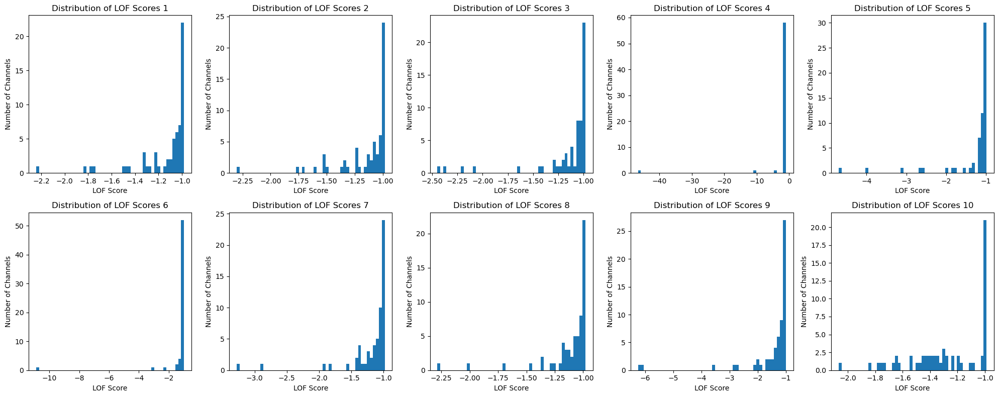

In [ ]:
def plot_bad_chans_lof_scores(lof_scores: list[int]):
  fig, axes = plt.subplots(2, 5, figsize=(20,8))

  axes = axes.flatten()

  for i, (score, ax) in enumerate(zip(lof_scores, axes)):
      ax.hist(score, bins=50)
      ax.set_xlabel('LOF Score')
      ax.set_ylabel('Number of Channels')
      ax.set_title(f'Distribution of LOF Scores {i+1}')
      
  plt.tight_layout()
  plt.show()
  
  
plot_bad_chans_lof_scores(lof_scores)

In [36]:
HBC = HandleBadChannels()
# bad_channels = HBC.select_channels_as_bad(lof_bad_chans, pyprep_bad_chans)
HBC.mark_bad_channels(filtered_eeg_data_dict, pyprep_bad_chans)
filtered_eeg_data_dict = HBC.reconstruct_bad_channels(filtered_eeg_data_dict)

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 89.8 mm
Computing interpolation matrix from 59 sensor positions
Interpolating 2 sensors
Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 89.8 mm
Computing interpolation matrix from 57 sensor positions
Interpolating 4 sensors
Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 89.8 mm
Computing interpolation matrix from 57 sensor positions
Interpolating 4 sensors
Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 89.8 mm
Computing interpolation matrix from 57 sensor positions
Interpolating 4 sensors
Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 89.8 mm


In [38]:
participant_01_runs = participant_runs(filtered_eeg_data_dict, 'P01')

In [39]:
participant_01_runs[1].plot(title='Handled Bad Channel EEG Data', block=False, scalings='50.0',
            picks='all', color='black',
          )
plt.show()

Using pyopengl with version 3.1.1a1


Channels marked as bad:
none


#### Functions for Saving and Loading Files

#### Saving processed raw files

In [40]:
def save_processed_files(baseOutputPath: str, sub_fol_name: str, name_of_file: str, eegData: Dict[str, List[Raw]]) -> None:
    os.makedirs(baseOutputPath, exist_ok=True)
    
    for subject_id, raws in eegData.items():
        subject_output_path = os.path.join(baseOutputPath, f'{sub_fol_name}/{subject_id}')
        os.makedirs(subject_output_path, exist_ok=True)
        
        for run_index, raw in enumerate(raws):
            output_file_path = os.path.join(subject_output_path, f'{name_of_file} {run_index + 1} raw.fif')
            raw.save(output_file_path, overwrite=True, verbose=False)
        
        print(f'Saved processed runs for {subject_id} to {subject_output_path}')


In [41]:
baseOutputPath = './Data/'
sub_fol_name = 'Processed EEG data'
name_of_file = 'Run'

save_processed_files(baseOutputPath, sub_fol_name, name_of_file, filtered_eeg_data_dict)

Saved processed runs for P01 to ./Data/Processed EEG data/P01
Saved processed runs for P02 to ./Data/Processed EEG data/P02
Saved processed runs for P03 to ./Data/Processed EEG data/P03
Saved processed runs for P04 to ./Data/Processed EEG data/P04
Saved processed runs for P05 to ./Data/Processed EEG data/P05
Saved processed runs for P06 to ./Data/Processed EEG data/P06
Saved processed runs for P07 to ./Data/Processed EEG data/P07
Saved processed runs for P08 to ./Data/Processed EEG data/P08
Saved processed runs for P09 to ./Data/Processed EEG data/P09
Saved processed runs for P10 to ./Data/Processed EEG data/P10


In [5]:
def extract_run_number(filename):
    """
    Extracts the run number from a filename.
    Args:
        filename (str): The filename to extract the run number from.
    Returns:
        int: The run number, or a large number if the run number cannot be determined.
    """
    match = re.search(r'Run (\d+)', filename)
    return int(match.group(1)) if match else float('inf')
  
def load_eeg_data(baseOutputPath: str) -> dict[List[Raw]]:
    """
    Loads all processed EEG runs from the base output path into a dictionary.
    
    Args:
        baseOutputPath (str): The base path where the processed EEG data is stored.
    
    Returns:
        dict: A dictionary where keys are participant IDs and values are lists of MNE Raw objects.
    """
    eeg_data = {}

    for participant_dir in sorted(os.listdir(baseOutputPath)):
        participant_path = os.path.join(baseOutputPath, participant_dir)
        if not os.path.isdir(participant_path):
            continue

        eeg_data[participant_dir] = []

        # Sort EEG files by run number
        eeg_files = sorted([f for f in os.listdir(participant_path) if f.endswith('.fif')], key=extract_run_number)
        for eeg_file in eeg_files:
            eeg_file_path = os.path.join(participant_path, eeg_file)
            try:
                raw = read_raw_fif(eeg_file_path, preload=True, verbose=False)
                eeg_data[participant_dir].append(raw)
            except Exception as e:
                print(f"Error loading file {eeg_file_path}: {e}")

    return eeg_data


##### Loading processed files

In [6]:
base_file_path = pathlib.Path('./Data/Processed EEG data/')
eeg_raw_dict = load_eeg_data(base_file_path)

In [7]:
participant_P01 = participant_runs(eeg_raw_dict, 'P01')

In [46]:
participant_P01[0].plot(title='Handled Bad Channel EEG Data', block=False, scalings='50.0',
            picks='all', color='black',
          )
plt.show()

Using pyopengl with version 3.1.1a1


Channels marked as bad:
none


In [47]:
events, event_id = events_from_annotations(participant_P01[0])
print(events, event_id)

Used Annotations descriptions: ['33536', '33544', '33545', '33547', '33554', '33693', '33694', '768', '776', '777', '779', '785', '786', '925', '926']
[[ 2560     0     8]
 [ 2560     0    12]
 [ 2560     0    13]
 [ 3072     0    10]
 [ 3840     0     1]
 [ 3840     0     5]
 [ 3840     0     3]
 [ 4409     0     8]
 [ 4409     0    12]
 [ 4409     0    13]
 [ 4921     0    11]
 [ 5689     0     1]
 [ 5689     0     5]
 [ 5689     0     4]
 [ 6433     0     8]
 [ 6433     0    12]
 [ 6433     0    13]
 [ 6945     0     9]
 [ 7713     0     1]
 [ 7713     0     5]
 [ 7713     0     2]
 [ 8431     0     8]
 [ 8431     0    12]
 [ 8431     0    13]
 [ 8943     0    15]
 [ 9711     0     1]
 [ 9711     0     5]
 [ 9711     0     7]
 [10257     0     8]
 [10257     0    12]
 [10257     0    13]
 [10769     0     9]
 [11537     0     1]
 [11537     0     5]
 [11537     0     2]
 [11836     0     8]
 [11836     0    12]
 [11836     0    13]
 [12348     0    14]
 [13116     0     1]
 [13116  

/var/folders/0h/5yv3vz210dx61dfqmldvk_h40000gn/T/ipykernel_59606/146460490.py:1: RuntimeWarning: More events than default colors available. You should pass a list of unique colors.
  mne.viz.plot_events(events)


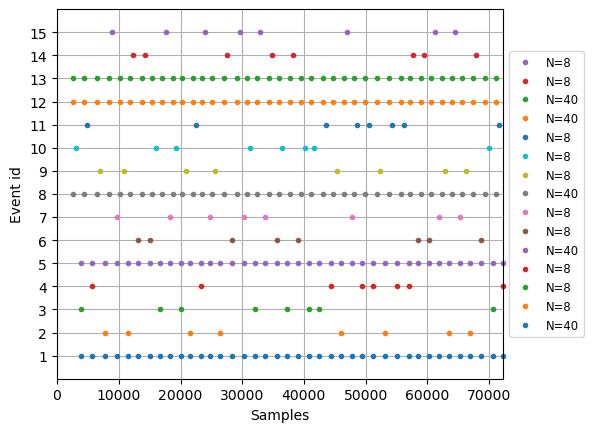

In [48]:
mne.viz.plot_events(events)
plt.show()

Effective window size : 8.000 (s)
Plotting amplitude spectral density (dB=True).


/Users/diegosabajo/miniconda3/envs/neural_ml/lib/python3.11/site-packages/mne/viz/utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


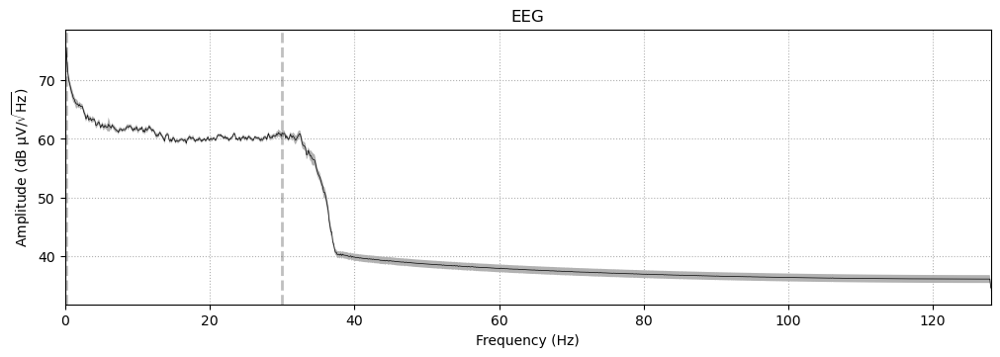

In [8]:
participant_P01[0].compute_psd().plot(average=True, amplitude=True)
plt.show()

### ICA Component Handling

##### Filter for ICA processing

In [9]:
eeg_ica_dict = filter_eeg_data(eeg_raw_dict, 1, 30)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples 

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 845 samples (3.301 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


##### Loading Filtered files for ICA

In [10]:
participant_01_runs = participant_runs(eeg_ica_dict, 'P01')

Effective window size : 8.000 (s)
Plotting amplitude spectral density (dB=True).


/Users/diegosabajo/miniconda3/envs/neural_ml/lib/python3.11/site-packages/mne/viz/utils.py:167: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


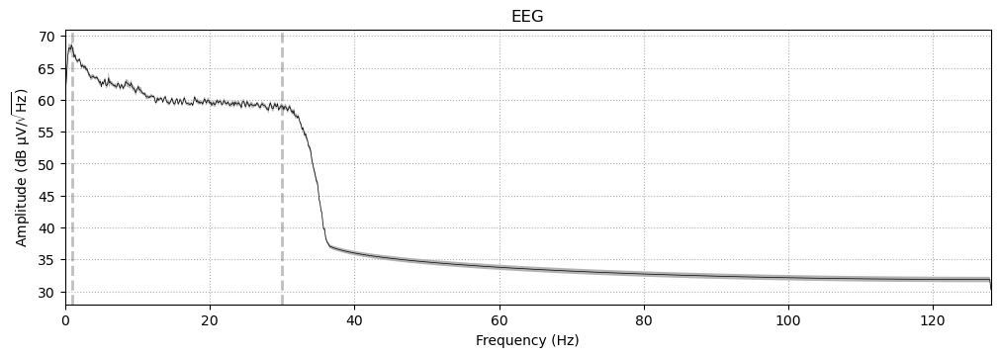

In [11]:
participant_01_runs[1].compute_psd().plot(average=True, amplitude=True)
plt.show()

In [53]:
participant_01_runs[5].plot(title='Raw EEG Data', block=True, scalings='50.0',
            picks='all', color='black',
          )
plt.show()

Using pyopengl with version 3.1.1a1
Channels marked as bad:
none


In [12]:
def create_system_montage(eeg_data_dict: dict[List[Raw]]):
    montage = mne.channels.make_standard_montage('standard_1005')
    for eeg_data_list in eeg_data_dict.values():
        for eeg_data in eeg_data_list:
            eeg_data.set_montage(montage)
            # eeg_data.plot(show=True)

create_system_montage(eeg_ica_dict)


In [13]:
participant_01_runs = participant_runs(eeg_ica_dict, 'P01')

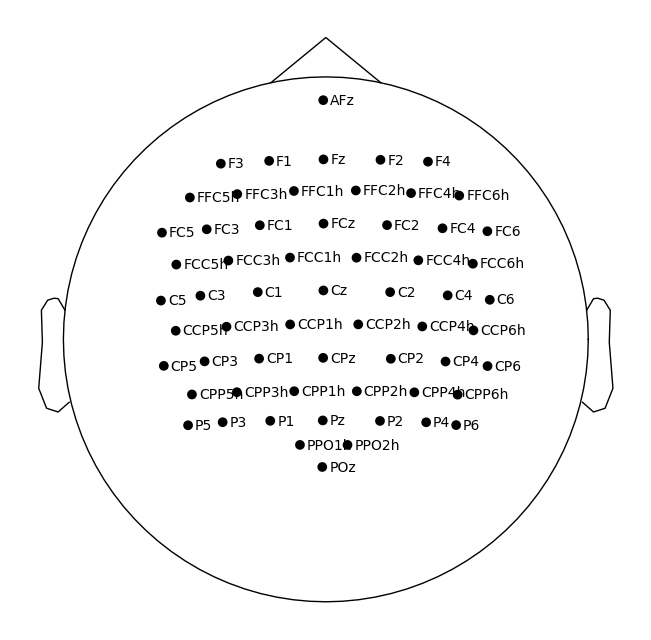

In [14]:
participant_01_runs[1].plot_sensors(ch_type='eeg', show_names=True)
plt.show()

1. **Frontal Area**
  - **AFz, F3, F1, Fz F2, F4: These are located on the forehead and capture frontal lobe activity, which is associated with functions such as reasoning, planning, parts of speech, movement and emotions

Effective window size : 8.000 (s)


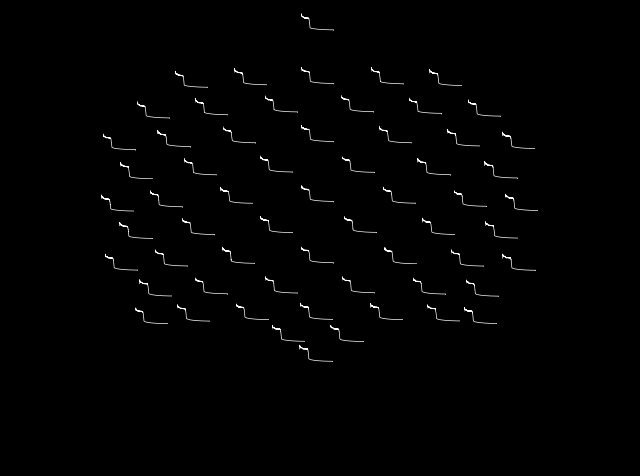

In [15]:
participant_01_runs[1].compute_psd().plot_topo()
plt.show()

### Hanlding Artifacts using ICA

#### Computing variance for artifact analysis

In [63]:
def explained_ica_variance(eeg_data_dict: dict[str, list[mne.io.fiff.raw.Raw]], n_components: int, is_cum: bool):
    """
    Calculates the explained variance of ICA components for each subject's EEG data.

    Args:
        eeg_data_dict (dict): A dictionary where keys are subject IDs and values are lists of EEG data.
        n_components (int): The number of ICA components.
        is_cum (bool): Whether to return cumulative explained variance.

    Returns:
        Tuple[dict[str, list[np.ndarray]], Optional[dict[str, list[np.ndarray]]]]: 
        The explained variances and cumulative explained variances (if is_cum is True) for each subject.
    """
    all_explained_vars = {}
    all_cum_vars = {}

    for subject_id, eeg_data_list in eeg_data_dict.items():
        explained_vars_list = []
        cum_vars_list = []
        for run_index, eeg_data in enumerate(eeg_data_list):
            print(f"Fitting ICA components for participant {subject_id}, run {run_index + 1}")
            ica = ICA(n_components=n_components, random_state=42, max_iter='auto')
            ica.fit(eeg_data)

            total_explained_variance = ica.pca_explained_variance_.sum()
            ica_explained_variances = ica.pca_explained_variance_ / total_explained_variance

            cumulative_explained_variance = None

            if is_cum:
                cumulative_explained_variance = np.cumsum(ica_explained_variances)

            explained_vars_list.append(ica_explained_variances)
            cum_vars_list.append(cumulative_explained_variance)

        all_explained_vars[subject_id] = explained_vars_list
        all_cum_vars[subject_id] = cum_vars_list

    return all_explained_vars, all_cum_vars

all_explained_vars, all_cum_vars = explained_ica_variance(eeg_ica_dict, 30, True)

Fitting ICA components for participant P01, run 1
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 22.3s.
Fitting ICA components for participant P01, run 2
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 86.1s.
Fitting ICA components for participant P01, run 3
Fitting ICA to data using 61 channels (please be patient, this may take a while)


/Users/diegosabajo/miniconda3/envs/neural_ml/lib/python3.11/site-packages/sklearn/decomposition/_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


Selecting by number: 30 components
Fitting ICA took 14.5s.
Fitting ICA components for participant P01, run 4
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 83.5s.
Fitting ICA components for participant P01, run 5
Fitting ICA to data using 61 channels (please be patient, this may take a while)


/Users/diegosabajo/miniconda3/envs/neural_ml/lib/python3.11/site-packages/sklearn/decomposition/_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


Selecting by number: 30 components
Fitting ICA took 10.1s.
Fitting ICA components for participant P01, run 6
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 8.5s.
Fitting ICA components for participant P01, run 7
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 53.5s.
Fitting ICA components for participant P01, run 8
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 91.2s.
Fitting ICA components for participant P01, run 9
Fitting ICA to data using 61 channels (please be patient, this may take a while)


/Users/diegosabajo/miniconda3/envs/neural_ml/lib/python3.11/site-packages/sklearn/decomposition/_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


Selecting by number: 30 components
Fitting ICA took 5.6s.
Fitting ICA components for participant P02, run 1
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 11.1s.
Fitting ICA components for participant P02, run 2
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 76.0s.
Fitting ICA components for participant P02, run 3
Fitting ICA to data using 61 channels (please be patient, this may take a while)


/Users/diegosabajo/miniconda3/envs/neural_ml/lib/python3.11/site-packages/sklearn/decomposition/_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


Selecting by number: 30 components
Fitting ICA took 6.2s.
Fitting ICA components for participant P02, run 4
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 4.9s.
Fitting ICA components for participant P02, run 5
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 14.8s.
Fitting ICA components for participant P02, run 6
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 74.7s.
Fitting ICA components for participant P02, run 7
Fitting ICA to data using 61 channels (please be patient, this may take a while)


/Users/diegosabajo/miniconda3/envs/neural_ml/lib/python3.11/site-packages/sklearn/decomposition/_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


Selecting by number: 30 components
Fitting ICA took 7.0s.
Fitting ICA components for participant P02, run 8
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 3.3s.
Fitting ICA components for participant P02, run 9
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 5.6s.
Fitting ICA components for participant P03, run 1
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 5.7s.
Fitting ICA components for participant P03, run 2
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 2.8s.
Fitting ICA components for participant P03, run 3
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 3.2

/Users/diegosabajo/miniconda3/envs/neural_ml/lib/python3.11/site-packages/sklearn/decomposition/_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


Selecting by number: 30 components
Fitting ICA took 4.3s.
Fitting ICA components for participant P05, run 2
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 3.9s.
Fitting ICA components for participant P05, run 3
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 6.2s.
Fitting ICA components for participant P05, run 4
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 5.3s.
Fitting ICA components for participant P05, run 5
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 4.4s.
Fitting ICA components for participant P05, run 6
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 5.5

/Users/diegosabajo/miniconda3/envs/neural_ml/lib/python3.11/site-packages/sklearn/decomposition/_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


Selecting by number: 30 components
Fitting ICA took 5.9s.
Fitting ICA components for participant P07, run 8
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 5.7s.
Fitting ICA components for participant P07, run 9
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 74.2s.
Fitting ICA components for participant P08, run 1
Fitting ICA to data using 61 channels (please be patient, this may take a while)


/Users/diegosabajo/miniconda3/envs/neural_ml/lib/python3.11/site-packages/sklearn/decomposition/_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


Selecting by number: 30 components
Fitting ICA took 74.5s.
Fitting ICA components for participant P08, run 2
Fitting ICA to data using 61 channels (please be patient, this may take a while)


/Users/diegosabajo/miniconda3/envs/neural_ml/lib/python3.11/site-packages/sklearn/decomposition/_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


Selecting by number: 30 components
Fitting ICA took 9.5s.
Fitting ICA components for participant P08, run 3
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 6.0s.
Fitting ICA components for participant P08, run 4
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 74.5s.
Fitting ICA components for participant P08, run 5
Fitting ICA to data using 61 channels (please be patient, this may take a while)


/Users/diegosabajo/miniconda3/envs/neural_ml/lib/python3.11/site-packages/sklearn/decomposition/_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


Selecting by number: 30 components
Fitting ICA took 13.7s.
Fitting ICA components for participant P08, run 6
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 75.9s.
Fitting ICA components for participant P08, run 7
Fitting ICA to data using 61 channels (please be patient, this may take a while)


/Users/diegosabajo/miniconda3/envs/neural_ml/lib/python3.11/site-packages/sklearn/decomposition/_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


Selecting by number: 30 components
Fitting ICA took 76.1s.
Fitting ICA components for participant P08, run 8
Fitting ICA to data using 61 channels (please be patient, this may take a while)


/Users/diegosabajo/miniconda3/envs/neural_ml/lib/python3.11/site-packages/sklearn/decomposition/_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


Selecting by number: 30 components
Fitting ICA took 106.6s.
Fitting ICA components for participant P08, run 9
Fitting ICA to data using 61 channels (please be patient, this may take a while)


/Users/diegosabajo/miniconda3/envs/neural_ml/lib/python3.11/site-packages/sklearn/decomposition/_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


Selecting by number: 30 components
Fitting ICA took 19.2s.
Fitting ICA components for participant P09, run 1
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 4.6s.
Fitting ICA components for participant P09, run 2
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 5.6s.
Fitting ICA components for participant P09, run 3
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 5.9s.
Fitting ICA components for participant P09, run 4
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 7.7s.
Fitting ICA components for participant P09, run 5
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 9.

In [64]:
for subject_id, explained_vars in all_explained_vars.items():
    for run_index, var in enumerate(explained_vars):
        print(f"Participant: {subject_id}, Run: {run_index + 1}, Explained Variances: {var}")
        
for subject_id, cum_vars in all_cum_vars.items():
    for run_index, var in enumerate(cum_vars):
        print(f"Participant: {subject_id}, Run: {run_index + 1}, Cumulative Explained Variances: {var}")

Participant: P01, Run: 1, Explained Variances: [7.93610106e-01 6.84890275e-02 3.29793107e-02 1.57757378e-02
 1.22141553e-02 8.81377151e-03 7.79056337e-03 5.60885331e-03
 4.93808999e-03 4.41857659e-03 3.83269930e-03 2.75101201e-03
 2.36724281e-03 2.06234611e-03 1.88377845e-03 1.73386315e-03
 1.67121331e-03 1.61036858e-03 1.46020418e-03 1.34539270e-03
 1.27792936e-03 1.20423835e-03 1.15057671e-03 1.06508183e-03
 1.02638431e-03 1.00033271e-03 9.64336909e-04 8.78608379e-04
 8.55017785e-04 8.34302316e-04 7.85922176e-04 7.51880750e-04
 7.02006377e-04 6.82057602e-04 6.69063265e-04 6.37397391e-04
 6.23944518e-04 6.15480186e-04 5.77896664e-04 5.73471881e-04
 5.34779188e-04 5.27627038e-04 5.12950221e-04 4.93258958e-04
 4.84057895e-04 4.60057987e-04 4.55328292e-04 4.37988503e-04
 4.27720376e-04 4.15148129e-04 4.06245271e-04 3.92849762e-04
 3.76719790e-04 3.65723889e-04 3.39433821e-04 3.19421104e-04
 3.18010218e-04 2.66812987e-04 2.33624419e-04 1.26753722e-17
 1.05407080e-17]
Participant: P01, Run

In [ ]:
import matplotlib.pyplot as plt

def plot_variances(all_explained_vars: dict[str, list[np.ndarray]], all_cum_vars: dict[str, list[np.ndarray]]):
    # Plot explained variances for each participant
    for participant_id, explained_var_list in all_explained_vars.items():
        fig, axes = plt.subplots(3, 3, figsize=(20, 10), constrained_layout=True)
        fig.suptitle(f'Explained Variances for Participant {participant_id}', fontsize=16)
        
        for run_index, explained_var in enumerate(explained_var_list):
            ax = axes[run_index // 3, run_index % 3]
            ax.plot(range(1, len(explained_var) + 1), explained_var, marker='o', linestyle='-', color='b')
            ax.set_xlabel('Number of Components')
            ax.set_ylabel('Explained Variance')
            ax.set_title(f'Run {run_index + 1}')
            ax.grid(True)

        # Hide any empty subplots
        for i in range(len(explained_var_list), 9):
            fig.delaxes(axes.flatten()[i])
        
        plt.show()

    # Plot cumulative explained variances for each participant
    for participant_id, cum_var_list in all_cum_vars.items():
        fig, axes = plt.subplots(3, 3, figsize=(20, 10), constrained_layout=True)
        fig.suptitle(f'Cumulative Explained Variances for Participant {participant_id}', fontsize=16)
        
        for run_index, cum_var in enumerate(cum_var_list):
            ax = axes[run_index // 3, run_index % 3]
            ax.step(range(1, len(cum_var) + 1), cum_var, where='mid', color='r')
            ax.set_xlabel('Number of Components')
            ax.set_ylabel('Cumulative Explained Variance (%)')
            ax.set_title(f'Run {run_index + 1}')
            ax.grid(True)

            # Add vertical line at 98% cumulative variance
            ax.axhline(y=0.98, color='k', linestyle='--', linewidth=1)
            components_at_98 = np.where(np.array(cum_var) >= 0.98)[0] + 1
            if components_at_98.size > 0:
                first_component_at_98 = components_at_98[0]
                ax.text(first_component_at_98, 0.98, f'{first_component_at_98} components', fontsize=8, ha='right', va='bottom', color='k')

        # Hide any empty subplots
        for i in range(len(cum_var_list), 9):
            fig.delaxes(axes.flatten()[i])
        
        plt.show()

# Example usage:
plot_variances(all_explained_vars, all_cum_vars)


In [ ]:
def get_components_at_98(cum_var: np.ndarray) -> int:
    """
    Determines the number of components that explain 98% of the variance.
    
    Args:
        cum_var (np.ndarray): Cumulative explained variance array.
    
    Returns:
        int: The number of components explaining 98% of the variance.
    """
    components_at_98 = np.where(cum_var >= 0.98)[0] + 1
    return components_at_98[0] if components_at_98.size > 0 else len(cum_var)

def create_participants_data(eeg_data_dict: dict[str, list[mne.io.fiff.raw.Raw]], all_cum_vars: dict[str, list[np.ndarray]]) -> List[dict]:
    """
    Creates a list of dictionaries containing participant data and the number of components explaining 98% variance for each run.
    
    Args:
        eeg_data_dict (dict): Dictionary where keys are subject IDs and values are lists of EEG data.
        all_cum_vars (dict): Dictionary where keys are subject IDs and values are lists of cumulative explained variances for each run.
    
    Returns:
        List[dict]: A list of dictionaries with participant data and the number of components explaining 98% variance.
    """
    participants_data = []
    
    for subject_id, eeg_data_list in eeg_data_dict.items():
        participant_info = {subject_id: eeg_data_list, "components": []}
        for cum_var in all_cum_vars[subject_id]:
            num_components = get_components_at_98(cum_var)
            participant_info["components"].append(num_components)
        participants_data.append(participant_info)
    
    return participants_data

# Example usage:
participants_data = create_participants_data(eeg_ica_dict, all_cum_vars)


#### Computing and Saving ICA components

In [18]:
class ICAProcessor: 
  def __init__(self, random_state=42, ica_class = ICA, read_ica =read_ica):
    self.random_state = random_state
    self.ica = None
    self.ica_class = ica_class
    self.read_ica = read_ica
    
  def compute_components(self, eeg_data: Raw, n_components: int): 
    """Compute Independent Component Analysis on data"""
    self.ica = self.ica_class(
      n_components=n_components, 
      random_state=self.random_state, 
      max_iter='auto'
      )
    self.ica.fit(eeg_data)
    
  def save_components(self, file_path: str):
    """Save ICA components to file"""
    if self.ica is None:
      raise ValueError("ICA components not computed yet")
    self.ica.save(file_path, overwrite=True)
    
  def load_components(self, file_path: str):
    """Load ICA components from file"""
    return self.read_ica(file_path)
    
  def plot_component(self, eeg_data: Raw, ica: mne.preprocessing.ica.ICA, run: int):
    """Plot ICA components for visualization"""
    ica[run].plot_components(title=f'ICA components, run {run + 1}', inst=eeg_data[run])
    plt.show()

##### ICA Participant 1 - 10

In [68]:
def save_processed_files(baseOutputPath: str, sub_fol_name: str, name_of_file: str, eegData: Dict[str, List[Raw]]) -> None:
    os.makedirs(baseOutputPath, exist_ok=True)
    
    for subject_id, raws in eegData.items():
        subject_output_path = os.path.join(baseOutputPath, f'{sub_fol_name}/{subject_id}')
        os.makedirs(subject_output_path, exist_ok=True)
        
        for run_index, raw in enumerate(raws):
            output_file_path = os.path.join(subject_output_path, f'{name_of_file} {run_index + 1} raw.fif')
            raw.save(output_file_path, overwrite=True, verbose=False)
        
        print(f'Saved processed runs for {subject_id} to {subject_output_path}')


In [69]:
def process_participants_data(participants_data: List[Dict[str, List[Raw]]], baseOutputPath: str):
    """
    Processes the participants data to compute and save ICA components.

    Args:
        participants_data (List[Dict[str, List[Raw]]]): List of participant data dictionaries.
        baseOutputPath (str): The base output path for saving files.
        sub_fol_name (str): The sub-folder name for each participant.
        name_of_file (str): The base name of the file to save.
    """
    os.makedirs(baseOutputPath, exist_ok=True)
    
    for idx, data in enumerate(participants_data, start=1):
        participant_id = f'P{idx:02}'
        print(f'Processing participant {participant_id}...\n')

        ica_processor = ICAProcessor()
        eeg_data_list = data[participant_id]
        components_list = data['components']

        participant_output_path = os.path.join(f'{baseOutputPath}/{participant_id}')
        print(baseOutputPath)
        os.makedirs(participant_output_path, exist_ok=True)

        for run_idx, (eeg_data, n_components) in enumerate(zip(eeg_data_list, components_list), start=1):
            print(f'  Processing run {run_idx} for participant {participant_id} with {n_components} components...')
            ica = ica_processor.compute_components(eeg_data, n_components=n_components)
            ica_filepath = os.path.join(participant_output_path, f'Run {run_idx}_ica.fif')
            ica_processor.save_components(ica_filepath)
            print(f'  Saved ICA components for run {run_idx} to {ica_filepath}')


baseOutputPath = './Data/Processed ICA components'
sub_fol_name = 'participant'

process_participants_data(participants_data, baseOutputPath)


Processing participant P01...

./Data/Processed ICA components
  Processing run 1 for participant P01 with 24 components...
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 24 components
Fitting ICA took 7.9s.
Overwriting existing file.
Writing ICA solution to /Users/diegosabajo/Documents/Projects/A.I./Prototype/EEG_Analysis/Data/Processed ICA components/P01/Run 1_ica.fif...
  Saved ICA components for run 1 to ./Data/Processed ICA components/P01/Run 1_ica.fif
  Processing run 2 for participant P01 with 23 components...
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 23 components
Fitting ICA took 46.9s.
Overwriting existing file.
Writing ICA solution to /Users/diegosabajo/Documents/Projects/A.I./Prototype/EEG_Analysis/Data/Processed ICA components/P01/Run 2_ica.fif...
  Saved ICA components for run 2 to ./Data/Processed ICA components/P01/Run 2_ica.fif
  Processing run 3 for parti

/Users/diegosabajo/miniconda3/envs/neural_ml/lib/python3.11/site-packages/sklearn/decomposition/_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


Selecting by number: 26 components
Fitting ICA took 6.1s.
Overwriting existing file.
Writing ICA solution to /Users/diegosabajo/Documents/Projects/A.I./Prototype/EEG_Analysis/Data/Processed ICA components/P01/Run 7_ica.fif...
  Saved ICA components for run 7 to ./Data/Processed ICA components/P01/Run 7_ica.fif
  Processing run 8 for participant P01 with 25 components...
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 25 components
Fitting ICA took 84.4s.
Overwriting existing file.
Writing ICA solution to /Users/diegosabajo/Documents/Projects/A.I./Prototype/EEG_Analysis/Data/Processed ICA components/P01/Run 8_ica.fif...
  Saved ICA components for run 8 to ./Data/Processed ICA components/P01/Run 8_ica.fif
  Processing run 9 for participant P01 with 19 components...
Fitting ICA to data using 61 channels (please be patient, this may take a while)


/Users/diegosabajo/miniconda3/envs/neural_ml/lib/python3.11/site-packages/sklearn/decomposition/_fastica.py:123: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


Selecting by number: 19 components
Fitting ICA took 2.3s.
Overwriting existing file.
Writing ICA solution to /Users/diegosabajo/Documents/Projects/A.I./Prototype/EEG_Analysis/Data/Processed ICA components/P01/Run 9_ica.fif...
  Saved ICA components for run 9 to ./Data/Processed ICA components/P01/Run 9_ica.fif
Processing participant P02...

./Data/Processed ICA components
  Processing run 1 for participant P02 with 6 components...
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 6 components
Fitting ICA took 1.0s.
Overwriting existing file.
Writing ICA solution to /Users/diegosabajo/Documents/Projects/A.I./Prototype/EEG_Analysis/Data/Processed ICA components/P02/Run 1_ica.fif...
  Saved ICA components for run 1 to ./Data/Processed ICA components/P02/Run 1_ica.fif
  Processing run 2 for participant P02 with 7 components...
Fitting ICA to data using 61 channels (please be patient, this may take a while)
Selecting by number: 7 component

##### Load Participants 1 - 20

In [20]:
def load_ica_components(baseOutputPath: str, num_participants: int) -> Dict[int, List[ICA]]:
    """
    Loads the ICA components for each participant.

    Args:
        baseOutputPath (str): The base output path where files are saved.
        sub_fol_name (str): The sub-folder name for each participant.
        num_participants (int): The number of participants.

    Returns:
        Dict[int, List[ICA]]: Dictionary of participant indices and their corresponding ICA objects.
    """
    ica_processor = ICAProcessor()
    ica_components = {}

    for idx in range(1, num_participants + 1):
        participant_id = f'P{idx:02}'
        participant_ica_list = []
        participant_output_path = os.path.join(baseOutputPath, participant_id)
        
        for run_idx in range(1, 10):  # Assuming each participant has 9 runs
            ica_filepath = os.path.join(participant_output_path, f'Run {run_idx}_ica.fif')
            print(f'Loading ICA components from {ica_filepath}...')
            ica = ica_processor.load_components(ica_filepath)
            participant_ica_list.append(ica)
        
        ica_components[participant_id] = participant_ica_list
    
    return ica_components


# Load ICA components for each participant
baseOutputPath = './Data/Processed ICA components'
num_participants = 10
ica_components = load_ica_components(baseOutputPath, num_participants)

Loading ICA components from ./Data/Processed ICA components/P01/Run 1_ica.fif...
Reading ./Data/Processed ICA components/P01/Run 1_ica.fif ...
Now restoring ICA solution ...
Ready.
Loading ICA components from ./Data/Processed ICA components/P01/Run 2_ica.fif...
Reading ./Data/Processed ICA components/P01/Run 2_ica.fif ...
Now restoring ICA solution ...
Ready.
Loading ICA components from ./Data/Processed ICA components/P01/Run 3_ica.fif...
Reading ./Data/Processed ICA components/P01/Run 3_ica.fif ...
Now restoring ICA solution ...
Ready.
Loading ICA components from ./Data/Processed ICA components/P01/Run 4_ica.fif...
Reading ./Data/Processed ICA components/P01/Run 4_ica.fif ...
Now restoring ICA solution ...
Ready.
Loading ICA components from ./Data/Processed ICA components/P01/Run 5_ica.fif...
Reading ./Data/Processed ICA components/P01/Run 5_ica.fif ...
Now restoring ICA solution ...
Ready.
Loading ICA components from ./Data/Processed ICA components/P01/Run 6_ica.fif...
Reading ./Data

In [21]:
# %matplotlib qt
import mne
import matplotlib.pyplot as plt
import numpy as np

def prepare_ica_artifacts(eeg_data: dict[int, Raw], 
                          ica_comp: dict[int, mne.preprocessing.ICA], 
                          run: int, 
                          comp_type: str) -> None:
  """
  Prepares the data and ICA components for plotting artifacts.

  Args:
      eeg_data (dict[int, mne.io.Raw]): Dictionary of EEG data.
      ica_comp (dict[int, mne.preprocessing.ICA]): Dictionary of ICA components.
      run (int): The ID of the participant.
      comp_type (str): Type of artifact to plot ('eye' or 'muscle').
  """
  # if run not in eeg_data or run not in ica_comp:
  #     print(f"Participant {run} data or ICA components not found.")
  #     return

  eeg_data_run = eeg_data[run]
  ica = ica_comp[run]
  if comp_type == 'eye':
      indices, scores = ica.find_bads_eog(eeg_data_run, verbose=False, threshold=3.5)
  elif comp_type == 'muscle':
      indices, scores = ica.find_bads_muscle(eeg_data_run, verbose=False)
  else:
      print(f"Invalid component type: {comp_type}. Choose 'eye' or 'muscle'.")
      return

  if len(indices) == 0:
      print(f"No {comp_type} movement artifacts detected for run {run + 1}.\n")
      return
  
  plot_ica_artifacts(eeg_data_run, ica, run, indices, scores, comp_type)

def plot_ica_artifacts(eeg_data: Raw, 
                       ica: mne.preprocessing.ICA, 
                       run: int, 
                       indices: list[int], 
                       scores: list[float], 
                       comp_type: str) -> None:
    """
    Plots ICA artifact components.

    Args:
        eeg_data (mne.io.Raw): The EEG data.
        ica (mne.preprocessing.ICA): The ICA components.
        run (int): The run of the participant.
        indices (list[int]): Indices of the bad components.
        scores (list[float]): Scores of the bad components.
        comp_type (str): Type of artifact to plot ('eye' or 'muscle').
    """
    n_indices = len(indices)

    ica.plot_scores(scores=scores, 
                    show=True, 
                    n_cols=3, 
                    figsize=(12, 5), 
                    exclude=[indices], 
                    title=f'{comp_type.capitalize()} Score, run {run + 1}')

    fig, axes = plt.subplots(n_indices, 5, figsize=(18, 6))
    if n_indices == 1:
        axes = np.expand_dims(axes, axis=0)

    for i, pick in enumerate(indices):
        ica.plot_properties(inst=eeg_data, picks=pick, axes=axes[i], show=False, verbose=False)

    plt.tight_layout()
    plt.show()

  
def plot_eog_epochs(eeg_data: dict[Raw], run: int):
  """
    Plots the EOG epochs.

    Args:
        eeg_data (mne.io.Raw): The EEG data to plot.
    """
  eog_epochs = create_eog_epochs(eeg_data[run], baseline=(-0.5, -0.2), verbose=False)
  eog_epochs.plot_image(combine="mean", title=f"EOG Epochs Heatmap, Run {run + 1}")
  eog_epochs.average().plot_joint(title=f'EOG Epochs Average, Run {run + 1}')
  plt.show()

In [22]:
def plot_component_power_spectrum(eeg_data, ica, run, comp_idx):
  ica_sources = ica[run].get_sources(eeg_data[run]).get_data()
  component_data = ica_sources[comp_idx]

  sfreq = eeg_data[run].info['sfreq']

  psd, freqs = mne.time_frequency.psd_array_welch(x=component_data, sfreq=sfreq, fmin=1, fmax=40, n_fft=256)
  psd_dB = 10 * np.log10(psd)


  plt.figure(figsize=(10, 5))
  plt.plot(freqs, psd_dB, c='red', marker='o', label=f'Component {comp_idx}')
  plt.xlabel('Frequency (Hz)')
  plt.ylabel('Power Spectral Density (uV^2/Hz)')
  plt.title(f'Power Spectrum of ICA Component {comp_idx}')
  plt.xlim(1, 40)
  plt.legend()
  plt.show()

#### ICA Components

#### Brain components
- Scalp topography often looks dipolar
- Residual variance from dipole fit (marked RV on images) should be low. Usually below 15% unless the - component is better explained with two dipoles
- Power spectrum decreases as frequency increased (1/f)
- Power spectrum usually has peaks between 5 and 30 Hz, most often at 10 Hz
- Epoched data will likely have a visible ERP

#### Eye component
- Scalp topographies suggest ECDs near eyes
- Power concentrated at low frequencies (below 5 Hz)
- Vertical eye movement components will contain blinks in the data
- Horizontal eye movement components will look like step functions

#### Muscle component
- Power concentrated in higher frequencies (20 Hz and above)
- Can still be dipolar, but will be located outside the skull

#### Heart component
- Clear QRS complex in the data at about 1 Hz
- Near linear gradient scalp topography
- No peaks in power spectrum

#### Line component
- Strong peak in power spectrum at either 50Hz or 60Hz

#### Channel component
- Very focal scalp topography
- Large and/or consistent artifacts in the component activations.
- Easily confused with muscle components, but PSD is different.

#### Other
- Anything that doesn't fit the above categories.
- More likely the higher the IC number (as in IC 150 of 220 is very likely to be "Other")
- Non-dipolar scalp maps
- Spectrum can still have weak 10 Hz peak as brain signals are likely mixed with other signals

In [ ]:
for i in range(1, 10):
  explained_var_ratio = ica_components[i].get_explained_variance_ratio(eeg_ica_dict[i])
  for channel_type, ratio in explained_var_ratio.items():
      print(f'Participant {i}')
      print(
          f"Fraction of {channel_type} variance explained by all components: " f"{ratio}"
      )
      print('\n')

In [23]:
def get_ica_components(ica_dict: dict[List], participant_id)-> List:
  ica_component = ica_dict.get(participant_id, [])
  return ica_component

In [24]:
pid = 1
def explained_var_by_comp(pid, ica, eeg_data):
  for i in range(participants_data[pid - 1]['components']):
    explained_var_ratio = ica[pid].get_explained_variance_ratio(
        eeg_data[pid], components=[i], ch_type="eeg"
    )
    # This time, print as percentage.
    ratio_percent = round(100 * explained_var_ratio["eeg"])
    print(
        f"Fraction of variance in EEG signal explained by component {i}: "
        f"{ratio_percent}%"
    )

### Participant 1

#### Run 1

In [25]:
pid = 'P01'
ica_component_p1 = get_ica_components(ica_components, pid)
eeg_data_p1= participant_runs(eeg_ica_dict, 'P01')

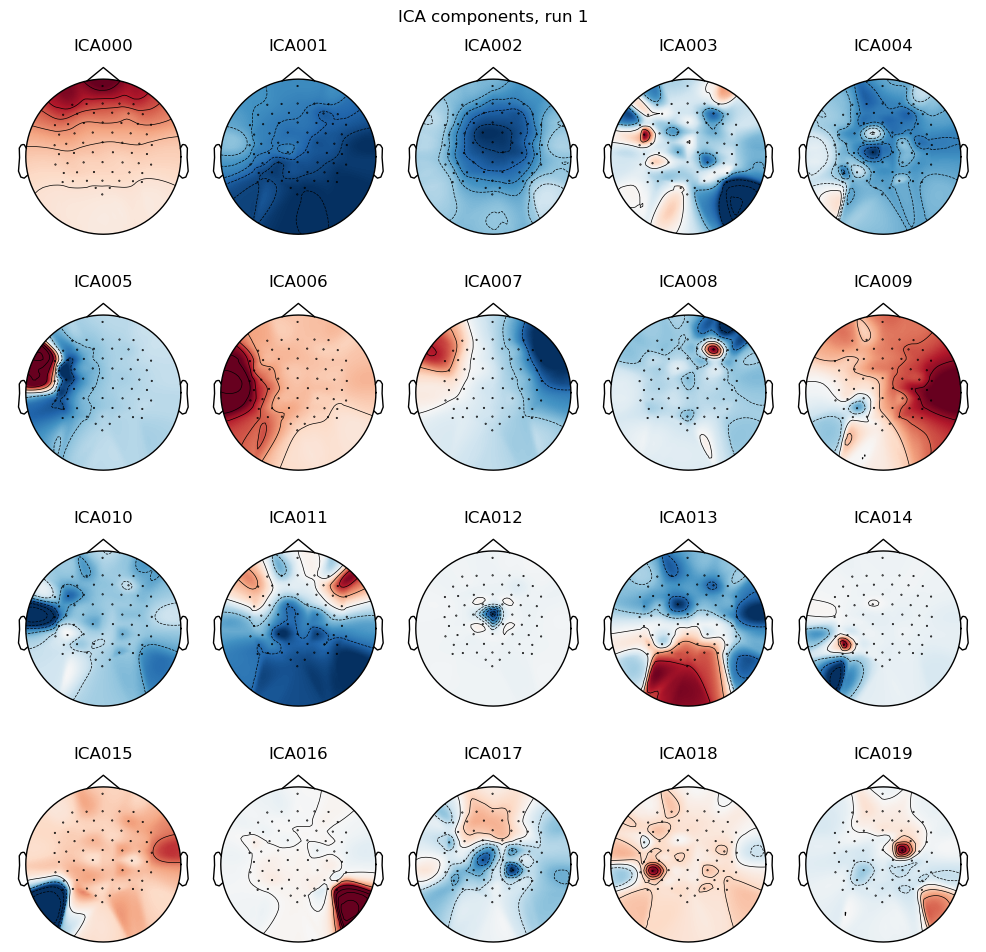

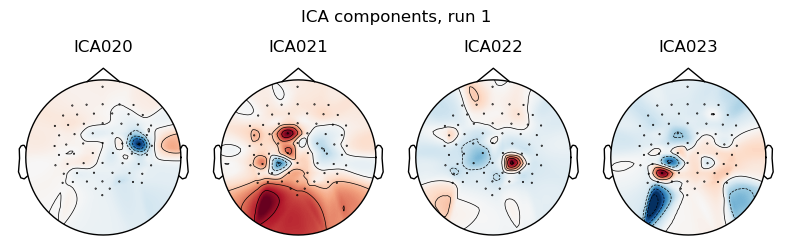

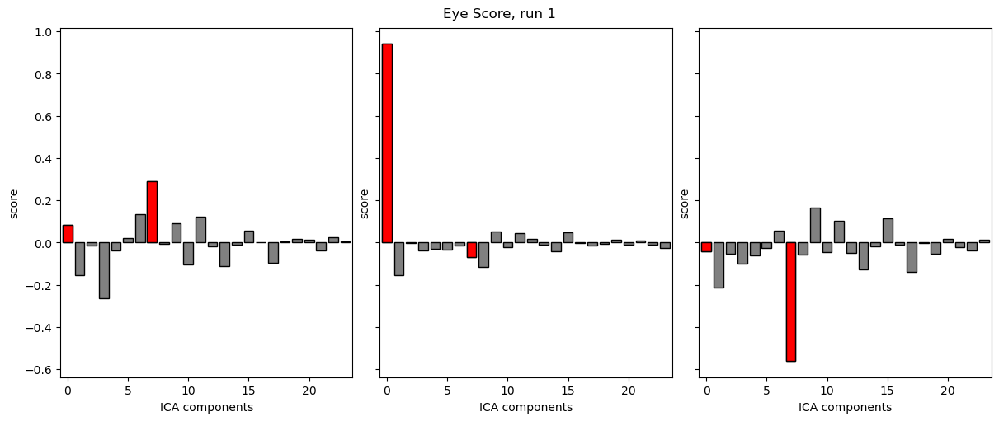

Not setting metadata
147 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
147 matching events found
No baseline correction applied
0 projection items activated


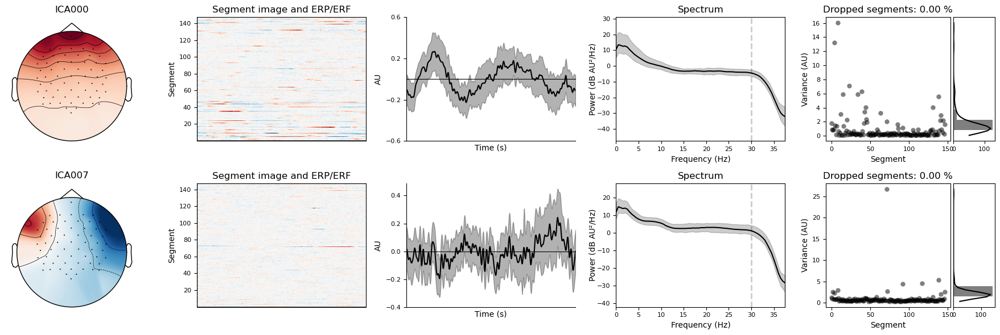

Not setting metadata
43 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


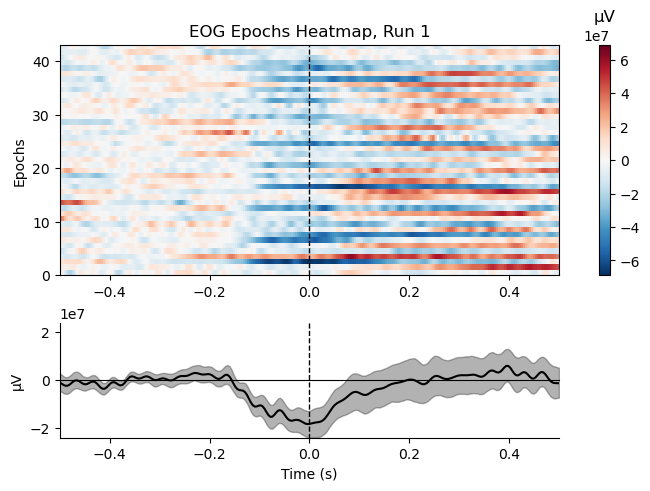

No projector specified for this dataset. Please consider the method self.add_proj.


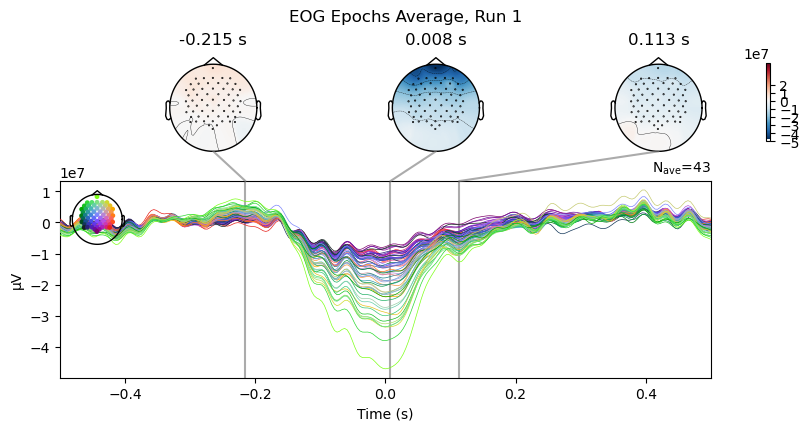

In [26]:
run = 1 - 1
ica_processor = ICAProcessor()
ica_processor.plot_component(eeg_data_p1, ica_component_p1, run)
prepare_ica_artifacts(eeg_data_p1, ica_component_p1, 0, 'eye')
plot_eog_epochs(eeg_data_p1, run)

In [81]:
ica_component_p1[run].plot_sources(eeg_data_p1[run])
plt.show()

Creating RawArray with float64 data, n_channels=26, n_times=75508


    Range : 0 ... 75507 =      0.000 ...   294.949 secs
Ready.
Using pyopengl with version 3.1.1a1


##### Manual Observation
- **Eye components**
  - Component 002 is likely eye blinking
  - component 005 is likely horizontal eye movement
  - component 007 is likely horizontal eye movement

- **Faulty Channel components**
  - Component 000 is likely a faulty channel signal (almost flat lined)


##### Automatic Observation
- **Eye components**
  - Component 002 is likely eye blinking
  - component 005 is likely horizontal eye movement

In [ ]:
eeg_raw_dict[pid].plot(title='Raw EEG Data', block=False, scalings='50.0',
            picks='all', color='black')

Using pyopengl with version 3.1.1a1


In [ ]:
ica_component_p1[run].exclude = [0, 2, 5, 7]
ica_component_p1[run].apply(eeg_raw_dict[run])

eeg_data_p1[run].plot(title='Raw EEG Data', block=False, scalings='50.0',
            picks='all', color='black')


Applying ICA to Raw instance
    Transforming to ICA space (17 components)
    Zeroing out 4 ICA components
    Projecting back using 61 PCA components
Using pyopengl with version 3.1.1a1


Channels marked as bad:
none
Channels marked as bad:
none


In [ ]:
eeg_data_p1[run].plot(title='Raw EEG Data', block=True, scalings='50.0',
            picks='all', color='black')


Using pyopengl with version 3.1.1a1
Channels marked as bad:
none


Effective window size : 1.000 (s)


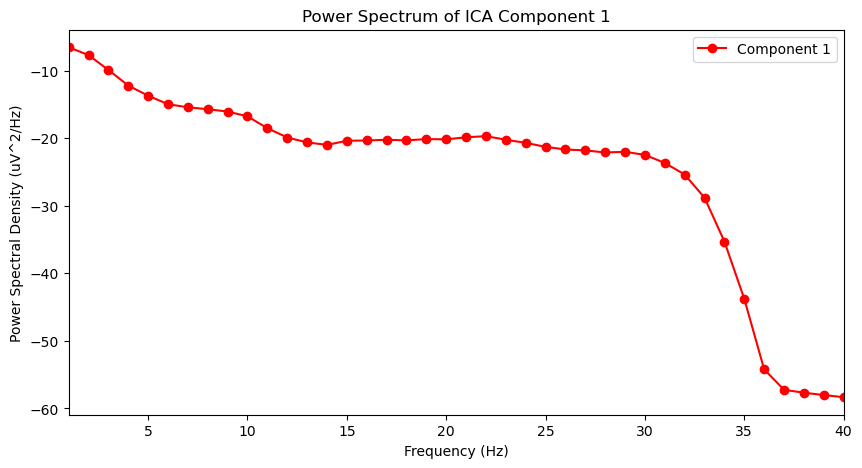

In [ ]:
plot_component_power_spectrum(eeg_data_p1, ica_component_p1, run, 1)

#### Run 2

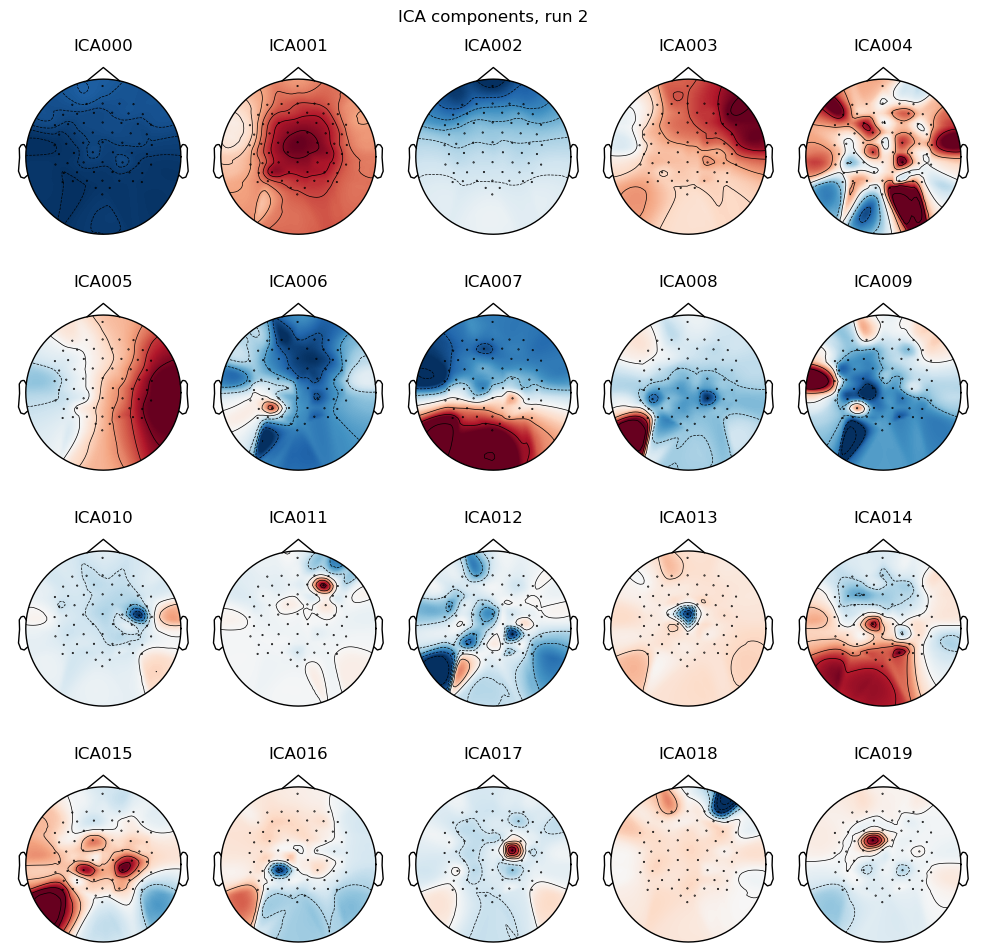

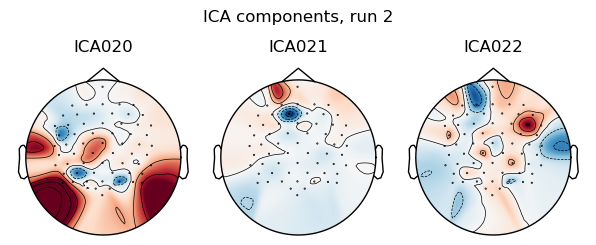

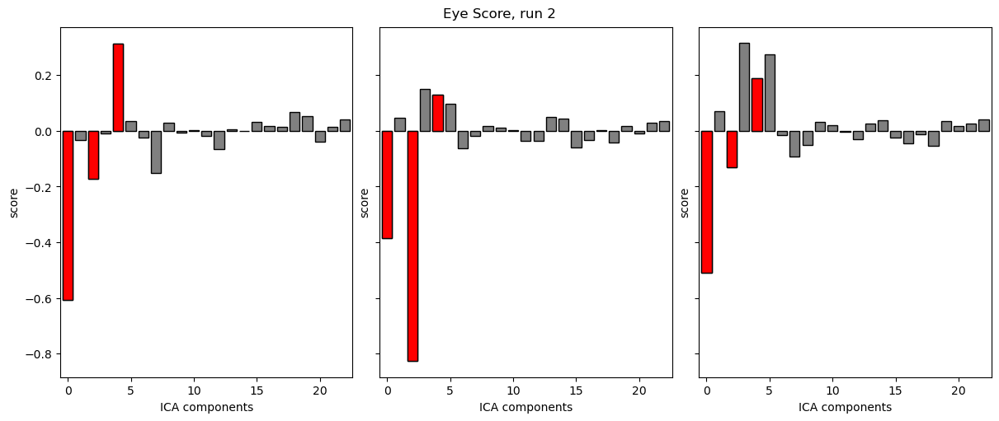

Not setting metadata
147 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
147 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
147 matching events found
No baseline correction applied
0 projection items activated


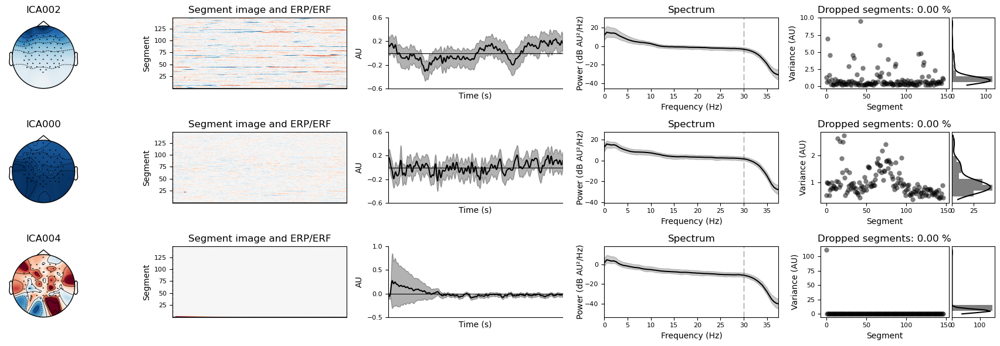

Not setting metadata
153 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


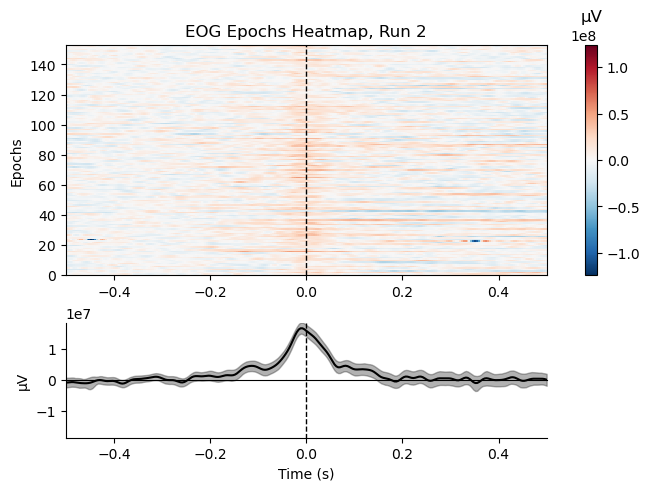

No projector specified for this dataset. Please consider the method self.add_proj.


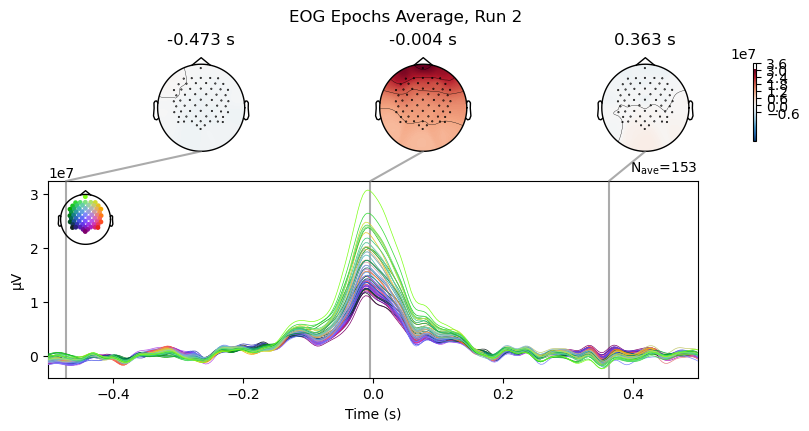

In [131]:
run = 2 - 1
ica_processor = ICAProcessor()
ica_processor.plot_component(eeg_data_p1, ica_component_p1, run)
prepare_ica_artifacts(eeg_data_p1, ica_component_p1, run, 'eye')
plot_eog_epochs(eeg_data_p1, run)

##### Manual Observation
- **Eye components**
  - component 002 is likely eye blinking
  - component 003 is likely horizontal eye movement

##### Automatic Observation
  - **Eye components**
  - None

In [ ]:
pid = 2
ica_components[pid].exclude = [2, 3]
ica_components[pid].apply(eeg_raw_dict[pid])

eeg_raw_dict[2].plot(title='Raw EEG Data', block=True, scalings='50.0',
            picks='all', color='black')

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 2 ICA components
    Projecting back using 61 PCA components


Measurement date,"April 05, 2017 07:46:15 GMT"
Experimenter,Unknown
Participant,sch
Digitized points,64 points
Good channels,"61 EEG, 3 EOG"
Bad channels,None
EOG channels,"eog-l, eog-m, eog-r"
ECG channels,Not available
Sampling frequency,256.00 Hz
Highpass,0.10 Hz
Lowpass,30.00 Hz


##### Run 3

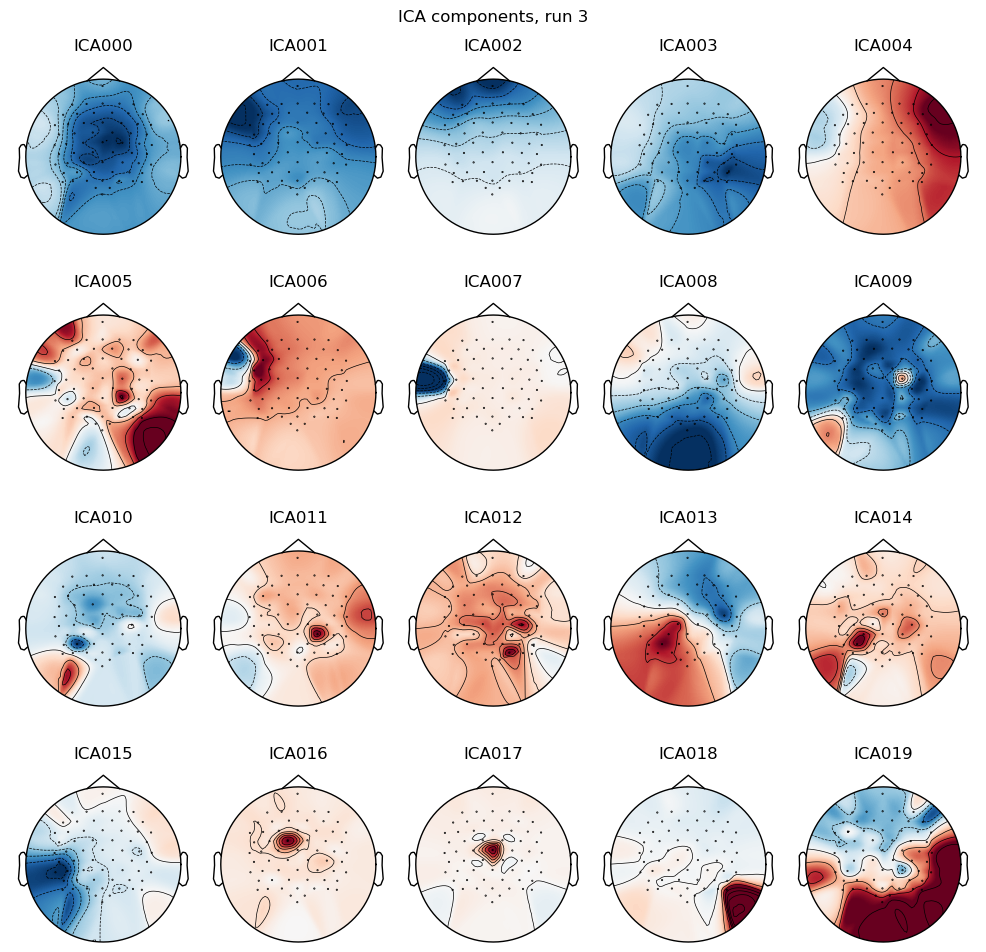

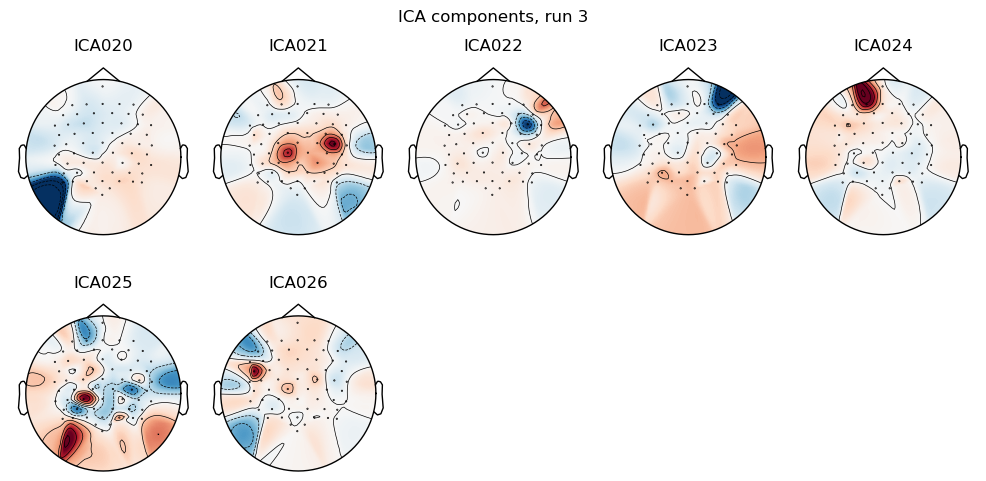

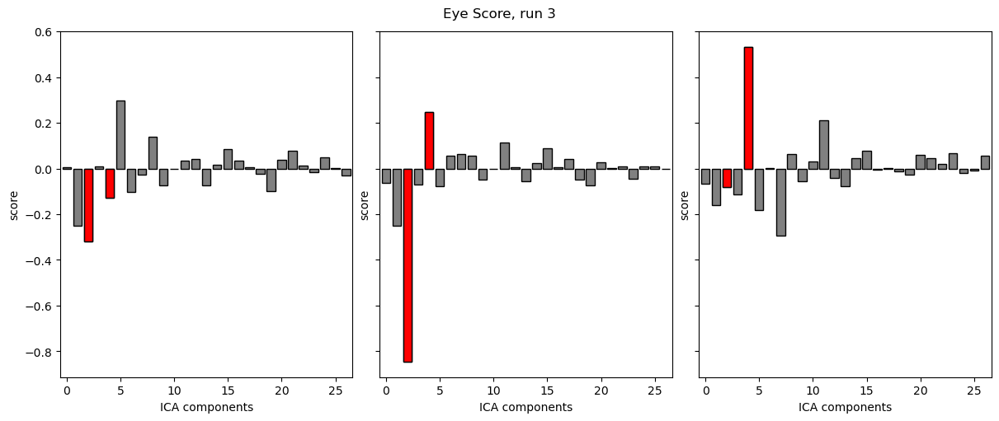

Not setting metadata
147 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
147 matching events found
No baseline correction applied
0 projection items activated


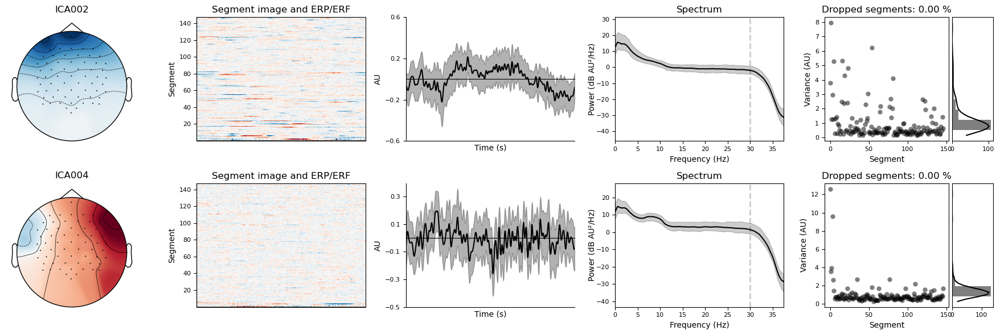

Not setting metadata
90 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


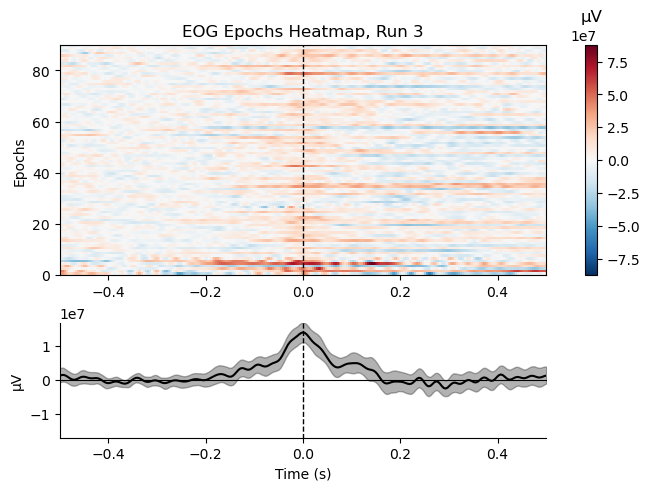

No projector specified for this dataset. Please consider the method self.add_proj.


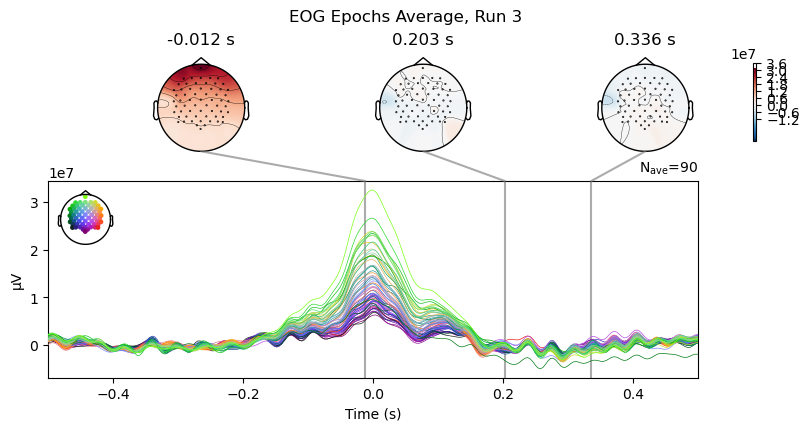

In [132]:
run = 3 - 1
ica_processor = ICAProcessor()
ica_processor.plot_component(eeg_data_p1, ica_component_p1, run)
prepare_ica_artifacts(eeg_data_p1, ica_component_p1, run, 'eye')
plot_eog_epochs(eeg_data_p1, run)

In [ ]:
pid = 3 
explained_var_by_comp(pid, ica_components, eeg_ica_dict)

Fraction of variance in EEG signal explained by component 0: 75%
Fraction of variance in EEG signal explained by component 1: 8%
Fraction of variance in EEG signal explained by component 2: 4%
Fraction of variance in EEG signal explained by component 3: 2%
Fraction of variance in EEG signal explained by component 4: 1%
Fraction of variance in EEG signal explained by component 5: 1%
Fraction of variance in EEG signal explained by component 6: 1%
Fraction of variance in EEG signal explained by component 7: 1%


In [83]:
pid = 3
ica_components[pid].plot_sources(eeg_ica_dict[pid])

KeyError: 3

##### Manual Observation
- **Eye components**
  - component 000 is likely eye blinking

#### Automatic Observation

In [ ]:
pid = 3
ica_components[pid].exclude = [0]
ica_components[pid].apply(eeg_raw_dict[pid])

Applying ICA to Raw instance
    Transforming to ICA space (8 components)
    Zeroing out 1 ICA component
    Projecting back using 61 PCA components


Measurement date,"April 06, 2017 07:56:20 GMT"
Experimenter,Unknown
Participant,p03
Digitized points,64 points
Good channels,"61 EEG, 3 EOG"
Bad channels,None
EOG channels,"eog-l, eog-m, eog-r"
ECG channels,Not available
Sampling frequency,256.00 Hz
Highpass,0.10 Hz
Lowpass,30.00 Hz


##### Run 4

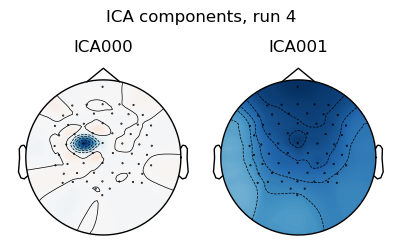

No eye movement artifacts detected for run 4.

Not setting metadata
98 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


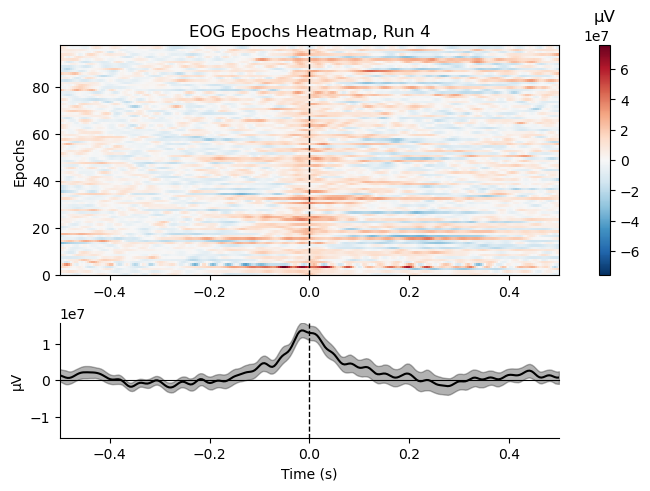

No projector specified for this dataset. Please consider the method self.add_proj.


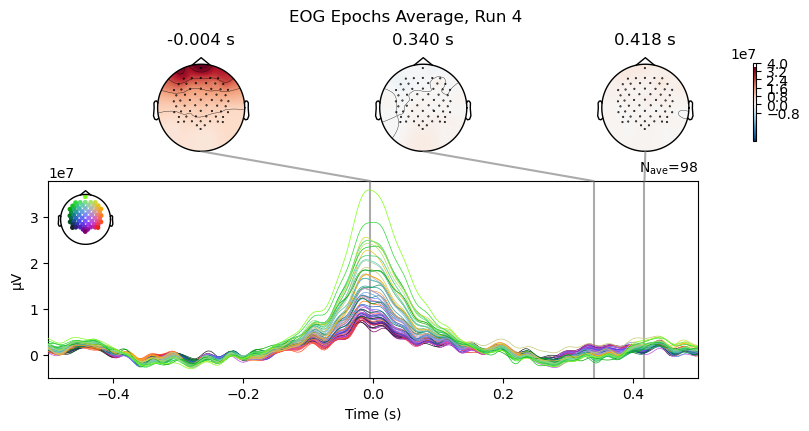

In [133]:
run = 4 - 1
ica_processor = ICAProcessor()
ica_processor.plot_component(eeg_data_p1, ica_component_p1, run)
prepare_ica_artifacts(eeg_data_p1, ica_component_p1, run, 'eye')
plot_eog_epochs(eeg_data_p1, run)

- **Manual Observation**
- **Eye components**
  - component 001 is likely eye blinking
  - component 006 is maybe horizontal eye movement
  - component 008 is maybe eye blinkingt

- **Automatic Observation**
  - **Eye components**
    - component 000 as eye blinking
  

In [ ]:
pid = 4
ica_components[pid].exclude = [1, 6, 8]
ica_components[pid].apply(eeg_raw_dict[pid])

Applying ICA to Raw instance
    Transforming to ICA space (11 components)
    Zeroing out 3 ICA components
    Projecting back using 61 PCA components


Measurement date,"April 07, 2017 07:47:19 GMT"
Experimenter,Unknown
Participant,p04
Digitized points,64 points
Good channels,"61 EEG, 3 EOG"
Bad channels,None
EOG channels,"eog-l, eog-m, eog-r"
ECG channels,Not available
Sampling frequency,256.00 Hz
Highpass,0.10 Hz
Lowpass,30.00 Hz


##### Run 5

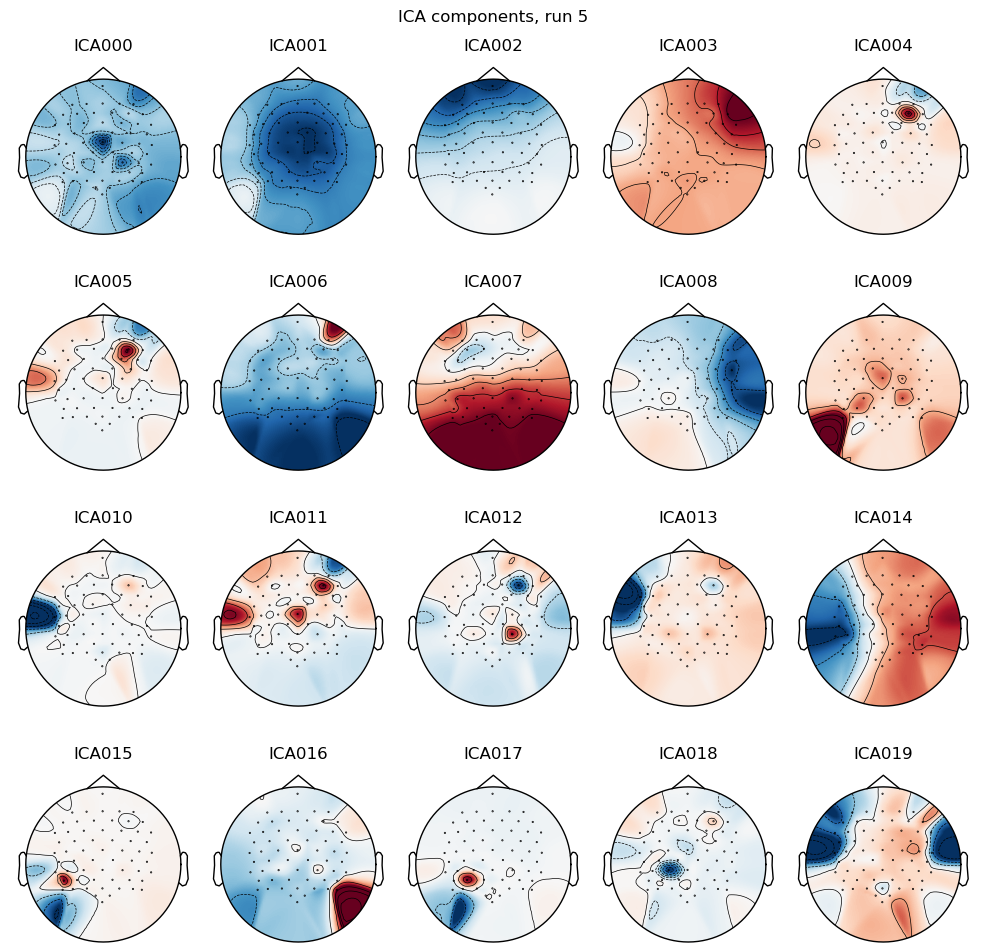

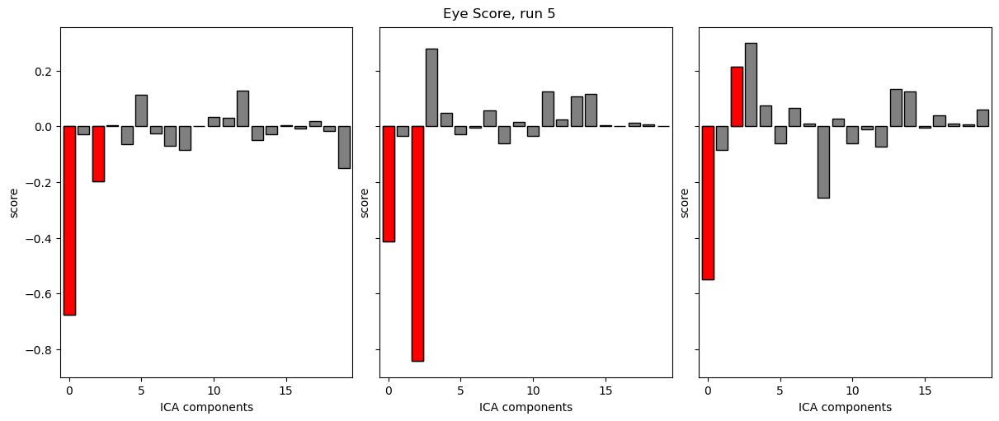

Not setting metadata
147 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
147 matching events found
No baseline correction applied
0 projection items activated


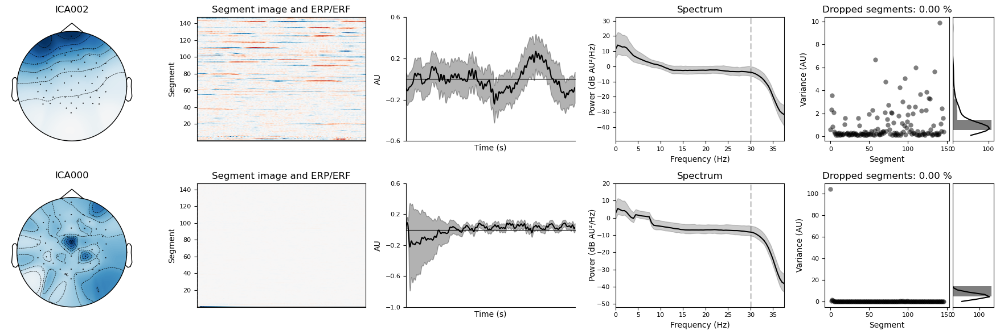

Not setting metadata
24 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


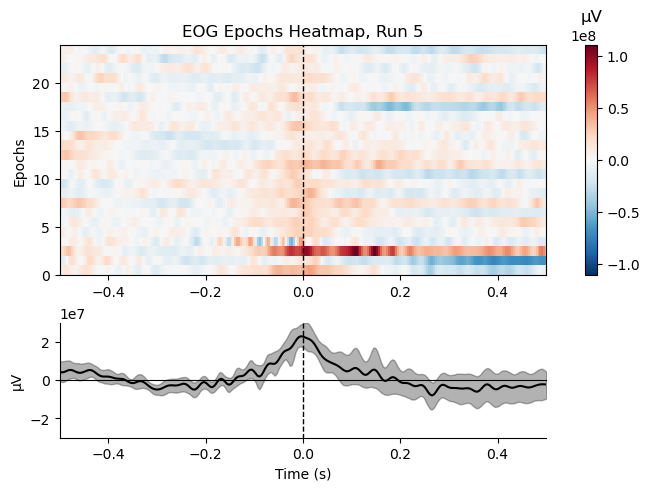

No projector specified for this dataset. Please consider the method self.add_proj.


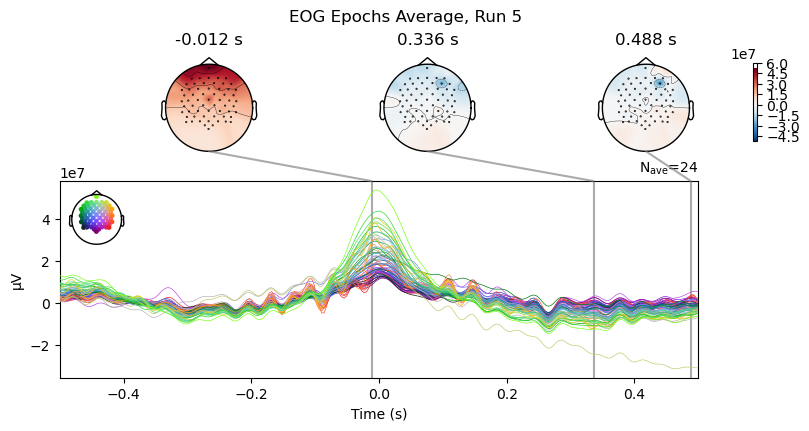

In [134]:
run = 5 - 1
ica_processor = ICAProcessor()
ica_processor.plot_component(eeg_data_p1, ica_component_p1, run)
prepare_ica_artifacts(eeg_data_p1, ica_component_p1, run, 'eye')
plot_eog_epochs(eeg_data_p1, run)

In [ ]:
pid = 5
ica_components[pid].plot_sources(eeg_ica_dict[pid])

Creating RawArray with float64 data, n_channels=15, n_times=1283636
    Range : 0 ... 1283635 =      0.000 ...  5014.199 secs
Ready.
Using pyopengl with version 3.1.1a1


**Manual Observation**
- **Eye components**
  - component 000 is likely eye blinking

**Automatic Observation**
- **Eye components**
  - Detected component 000 as eye blinking

In [ ]:
pid = 5
ica_components[pid].exclude = [0]
ica_components[pid].apply(eeg_raw_dict[pid])

Applying ICA to Raw instance
    Transforming to ICA space (12 components)
    Zeroing out 1 ICA component
    Projecting back using 61 PCA components


Measurement date,"April 12, 2017 07:42:55 GMT"
Experimenter,Unknown
Participant,p05
Digitized points,64 points
Good channels,"61 EEG, 3 EOG"
Bad channels,None
EOG channels,"eog-l, eog-m, eog-r"
ECG channels,Not available
Sampling frequency,256.00 Hz
Highpass,0.10 Hz
Lowpass,30.00 Hz


##### Run 6

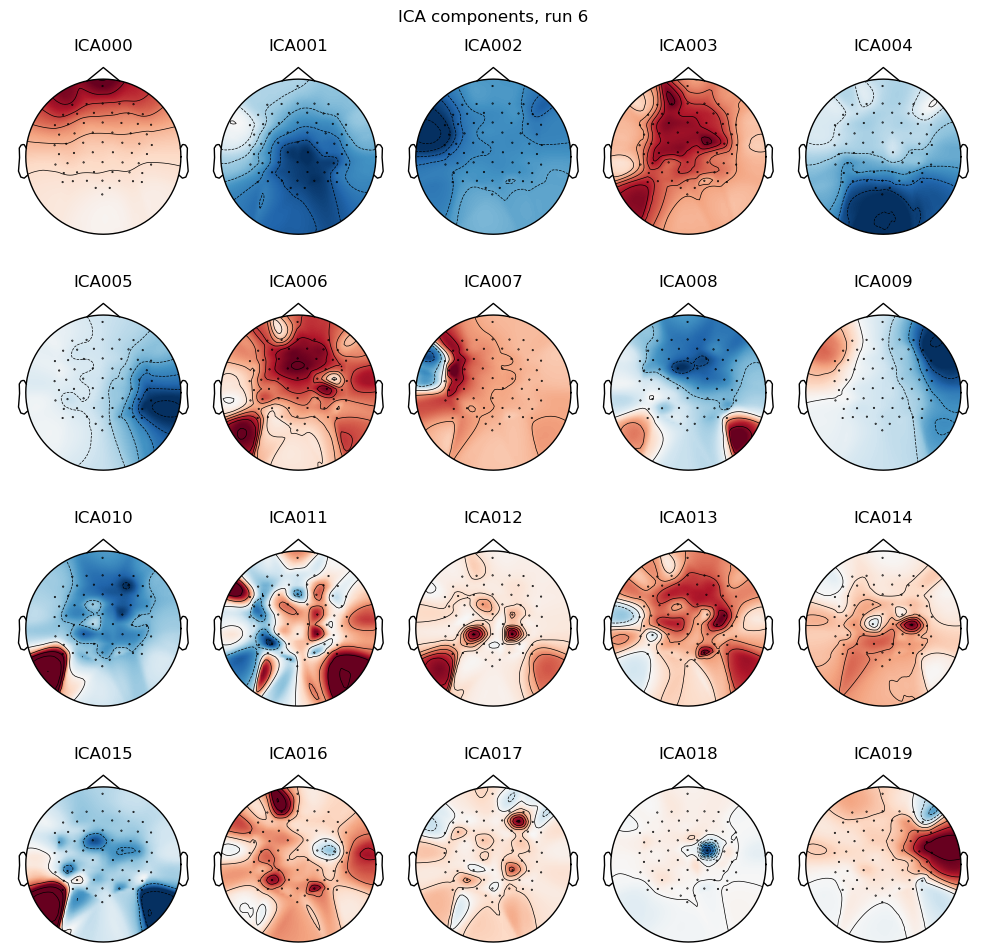

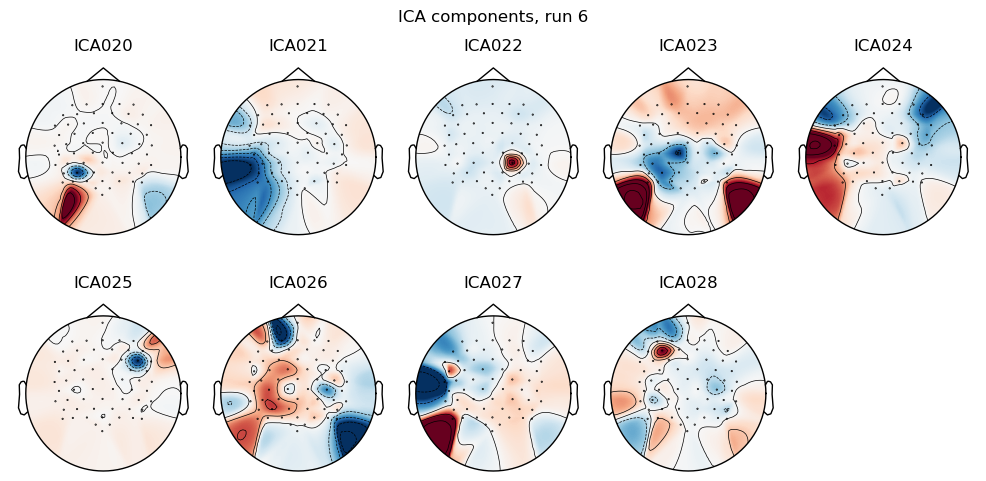

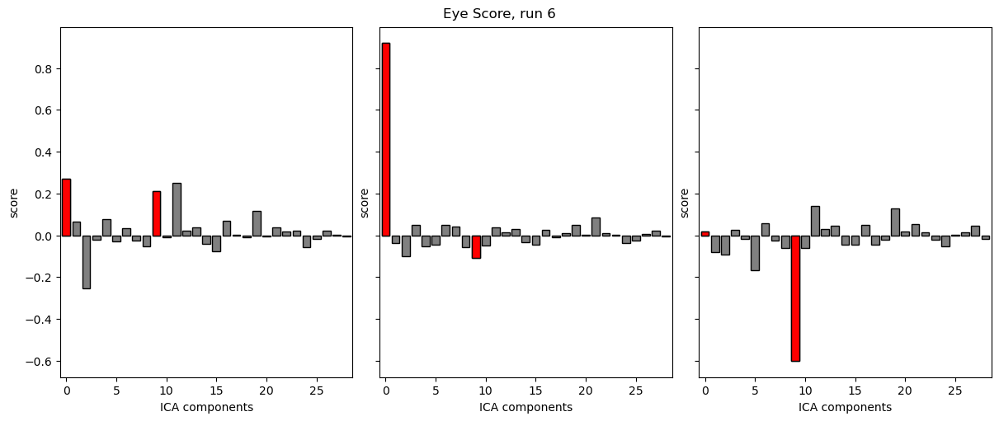

Not setting metadata
147 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
147 matching events found
No baseline correction applied
0 projection items activated


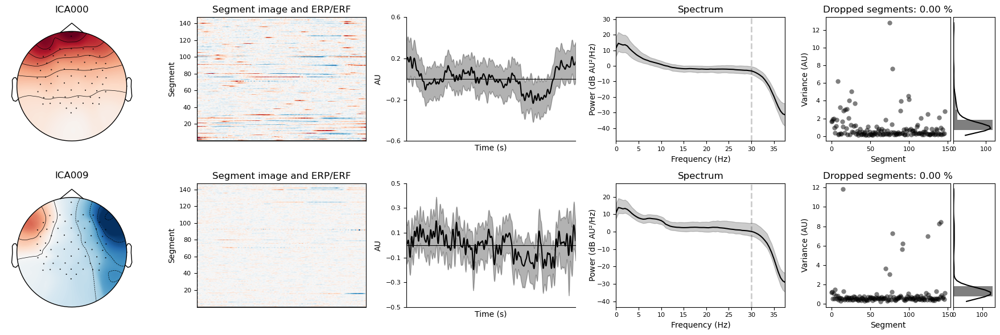

Not setting metadata
97 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


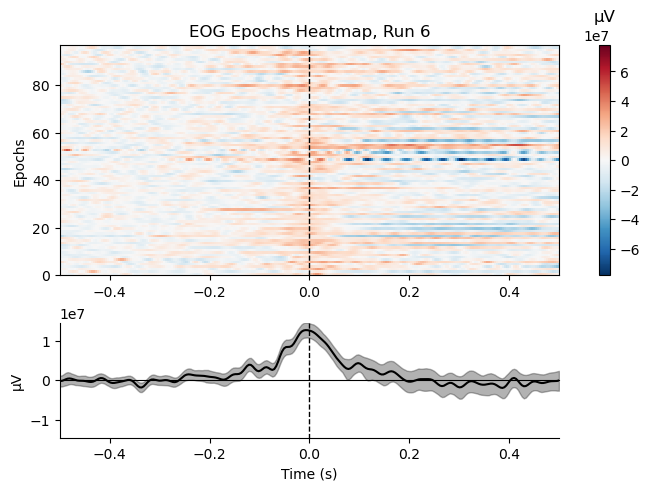

No projector specified for this dataset. Please consider the method self.add_proj.


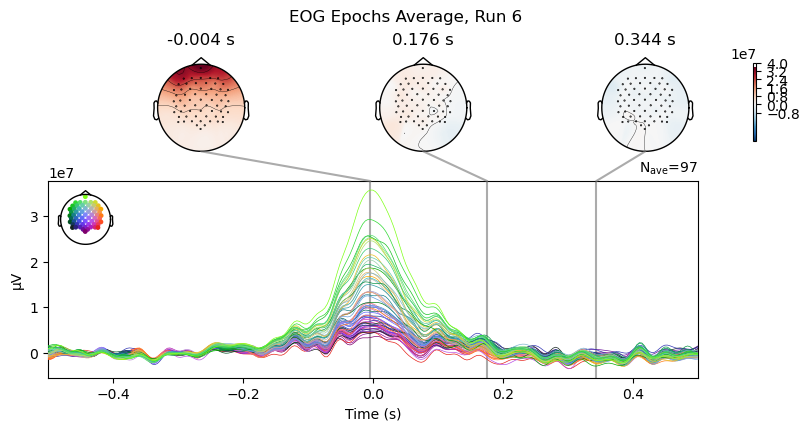

In [135]:
run = 6 - 1
ica_processor = ICAProcessor()
ica_processor.plot_component(eeg_data_p1, ica_component_p1, run)
prepare_ica_artifacts(eeg_data_p1, ica_component_p1, run, 'eye')
plot_eog_epochs(eeg_data_p1, run)

In [ ]:
pid = 6
ica_components[pid].plot_sources(eeg_ica_dict[pid])

Creating RawArray with float64 data, n_channels=18, n_times=1283636
    Range : 0 ... 1283635 =      0.000 ...  5014.199 secs
Ready.
Using pyopengl with version 3.1.1a1


**Manual Observation**
- **Eye components**
  - component 000 is likely eye blinking
  - component 004 is likely eye blinking
  - component 009 is maybe horizontal eye movementg

**Automatic Observation**
- **Eye components**
  - Detected component 000 as eye blinking

In [ ]:
pid = 6
ica_components[pid].exclude = [0, 4, 9]
ica_components[pid].apply(eeg_raw_dict[pid])

Applying ICA to Raw instance
    Transforming to ICA space (15 components)
    Zeroing out 3 ICA components
    Projecting back using 61 PCA components


Measurement date,"April 12, 2017 12:04:45 GMT"
Experimenter,Unknown
Participant,p06
Digitized points,64 points
Good channels,"61 EEG, 3 EOG"
Bad channels,None
EOG channels,"eog-l, eog-m, eog-r"
ECG channels,Not available
Sampling frequency,256.00 Hz
Highpass,0.10 Hz
Lowpass,30.00 Hz


##### Run 7

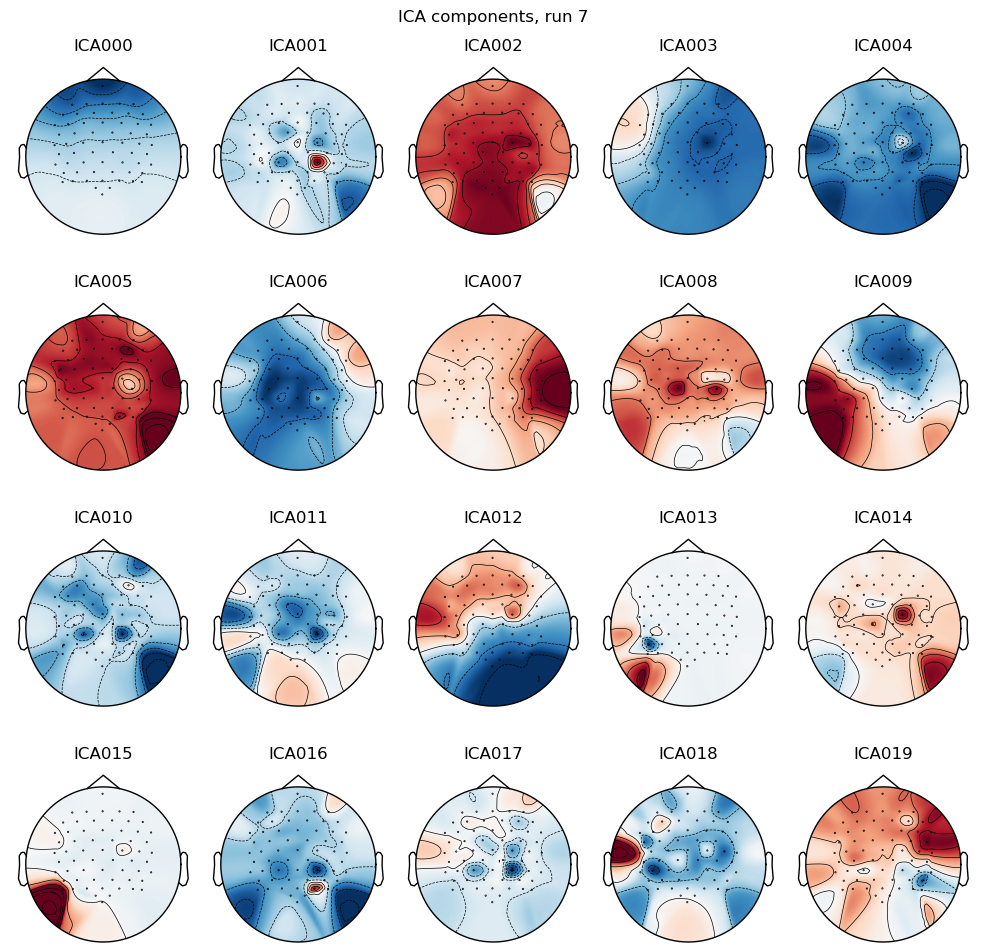

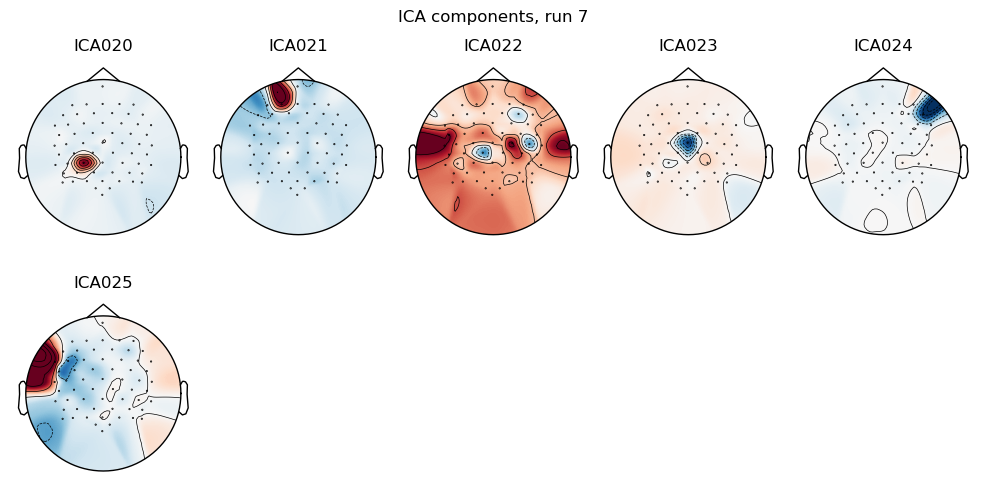

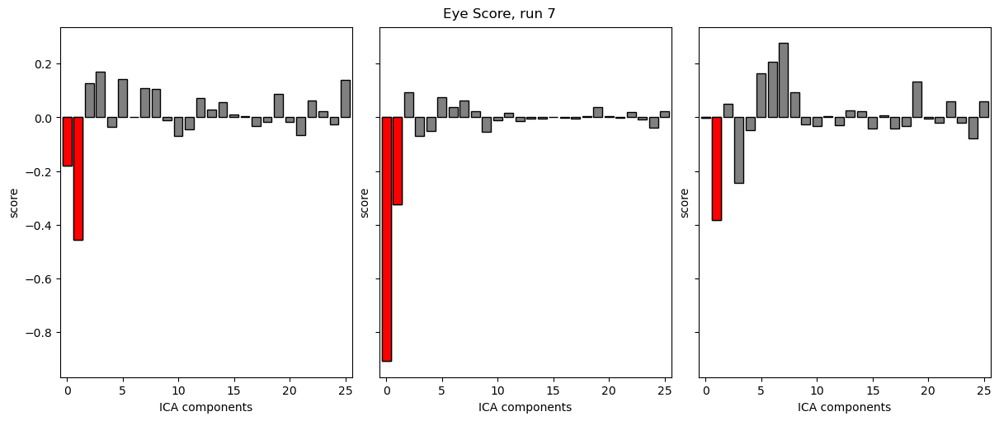

Not setting metadata
147 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
147 matching events found
No baseline correction applied
0 projection items activated


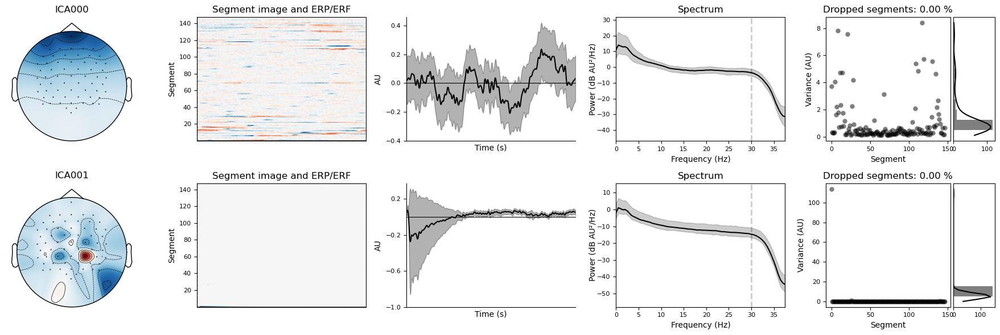

Not setting metadata
50 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


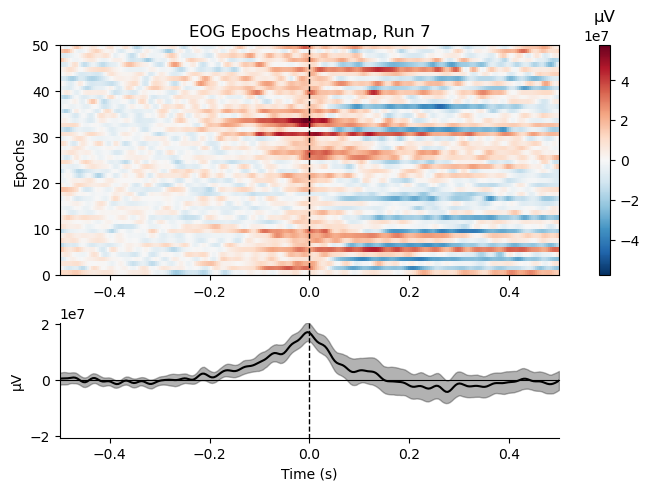

No projector specified for this dataset. Please consider the method self.add_proj.


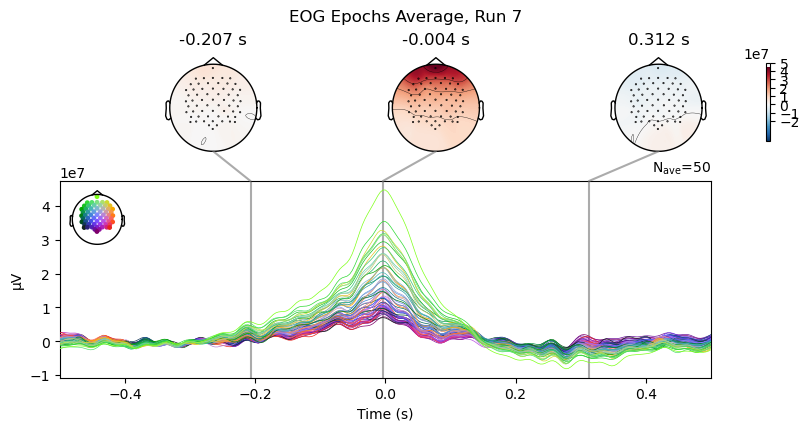

In [136]:
run = 7 - 1
ica_processor = ICAProcessor()
ica_processor.plot_component(eeg_data_p1, ica_component_p1, run)
prepare_ica_artifacts(eeg_data_p1, ica_component_p1, run, 'eye')
plot_eog_epochs(eeg_data_p1, run)

In [137]:
pid = 7
ica_components[pid].plot_sources(eeg_ica_dict[pid])

KeyError: 7

**Manual Observation**
- **Eye components**
  - component 000 is likely eye blinking
  - component 001 is likely eye blinking
  - component 002 is maybe horizontal eye movement

**Automatic Observation**
- **Eye components**
  - Detected component 002 as eye blinking

In [ ]:
pid = 7
ica_components[pid].exclude = [0, 1, 2]
ica_components[pid].apply(eeg_raw_dict[pid])

Applying ICA to Raw instance
    Transforming to ICA space (12 components)
    Zeroing out 3 ICA components
    Projecting back using 61 PCA components


Measurement date,"April 13, 2017 07:39:25 GMT"
Experimenter,Unknown
Participant,p07
Digitized points,64 points
Good channels,"61 EEG, 3 EOG"
Bad channels,None
EOG channels,"eog-l, eog-m, eog-r"
ECG channels,Not available
Sampling frequency,256.00 Hz
Highpass,0.10 Hz
Lowpass,30.00 Hz


##### Run 8

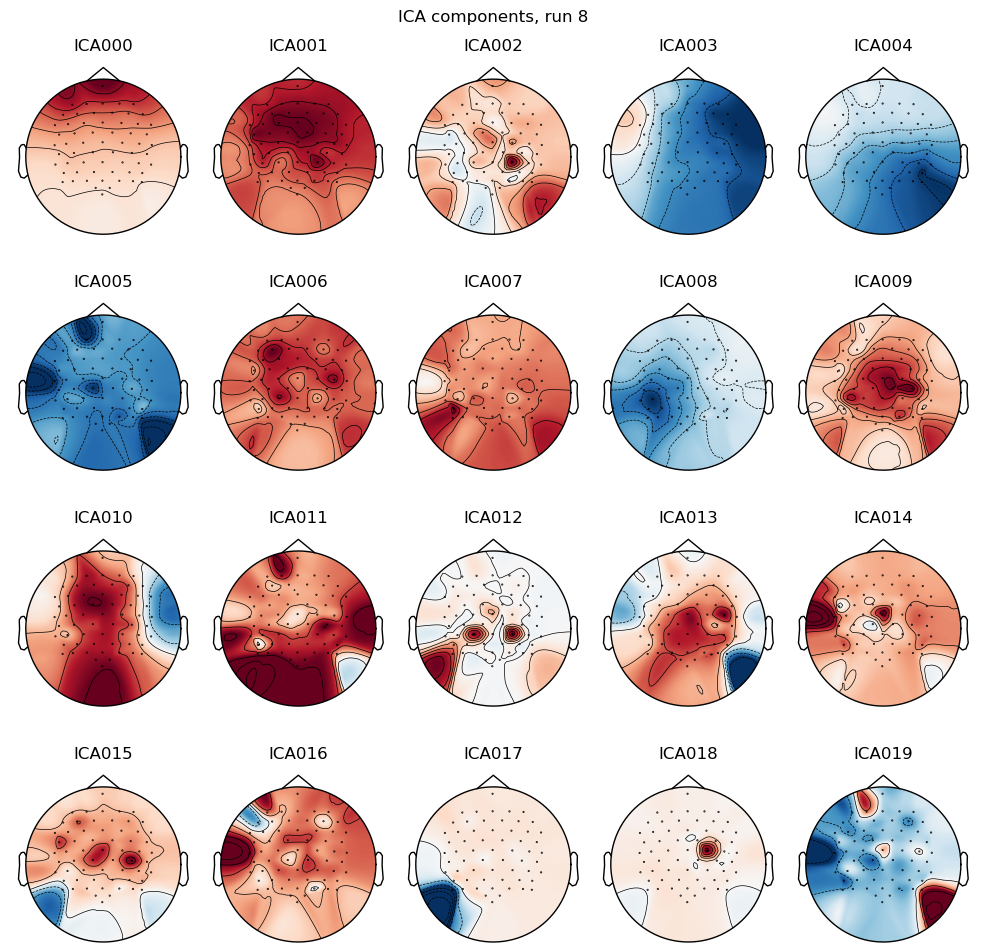

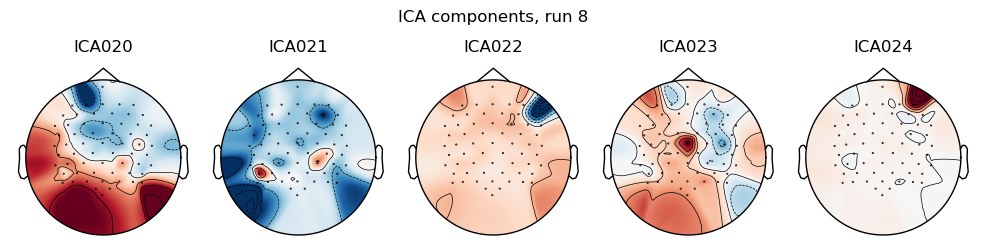

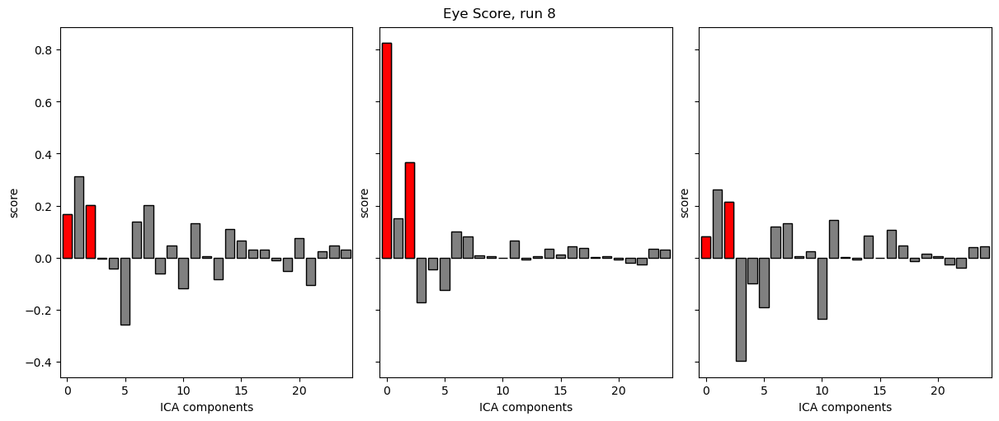

Not setting metadata
147 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
147 matching events found
No baseline correction applied
0 projection items activated


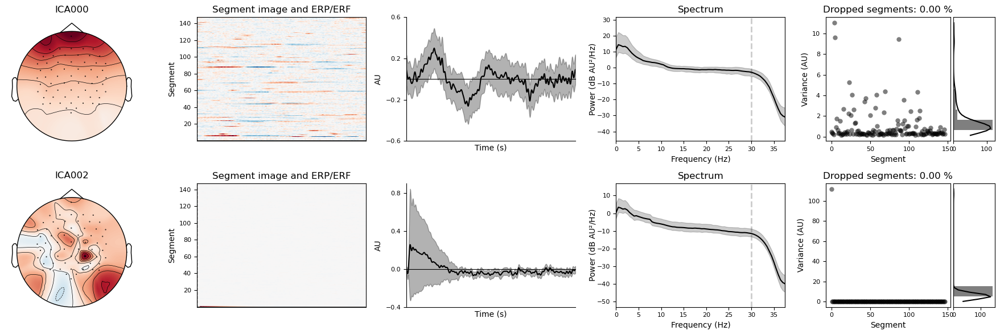

Not setting metadata
31 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


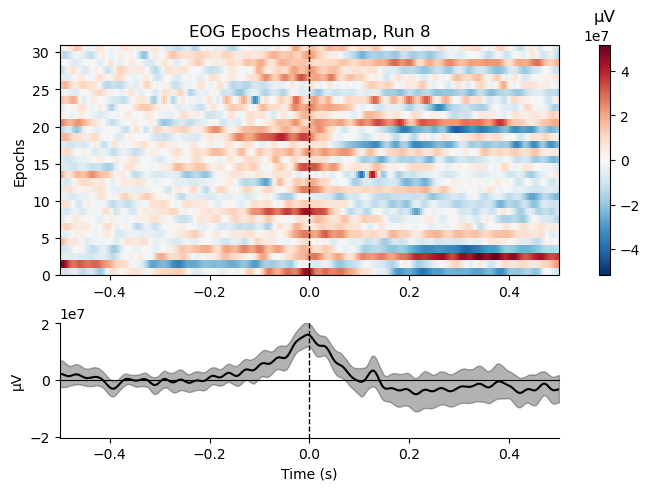

No projector specified for this dataset. Please consider the method self.add_proj.


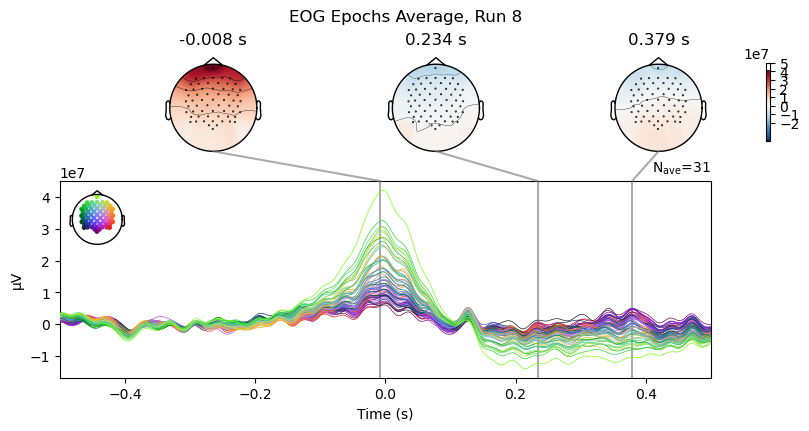

In [138]:
run = 8 - 1
ica_processor = ICAProcessor()
ica_processor.plot_component(eeg_data_p1, ica_component_p1, run)
prepare_ica_artifacts(eeg_data_p1, ica_component_p1, run, 'eye')
plot_eog_epochs(eeg_data_p1, run)

**Manual Observation**
- **Eye components**
  - component 000 is likely eye blinking
  - component 002 is likely horizontal eye movement

**Automatic Observation**
- **Eye components**
  - None

In [ ]:
pid = 8
ica_components[pid].exclude = [0, 2]
ica_components[pid].apply(eeg_raw_dict[pid])

Applying ICA to Raw instance
    Transforming to ICA space (10 components)
    Zeroing out 2 ICA components
    Projecting back using 61 PCA components


Measurement date,"May 04, 2017 08:23:57 GMT"
Experimenter,Unknown
Participant,p08
Digitized points,64 points
Good channels,"61 EEG, 3 EOG"
Bad channels,None
EOG channels,"eog-l, eog-m, eog-r"
ECG channels,Not available
Sampling frequency,256.00 Hz
Highpass,0.10 Hz
Lowpass,30.00 Hz


##### Participant 9

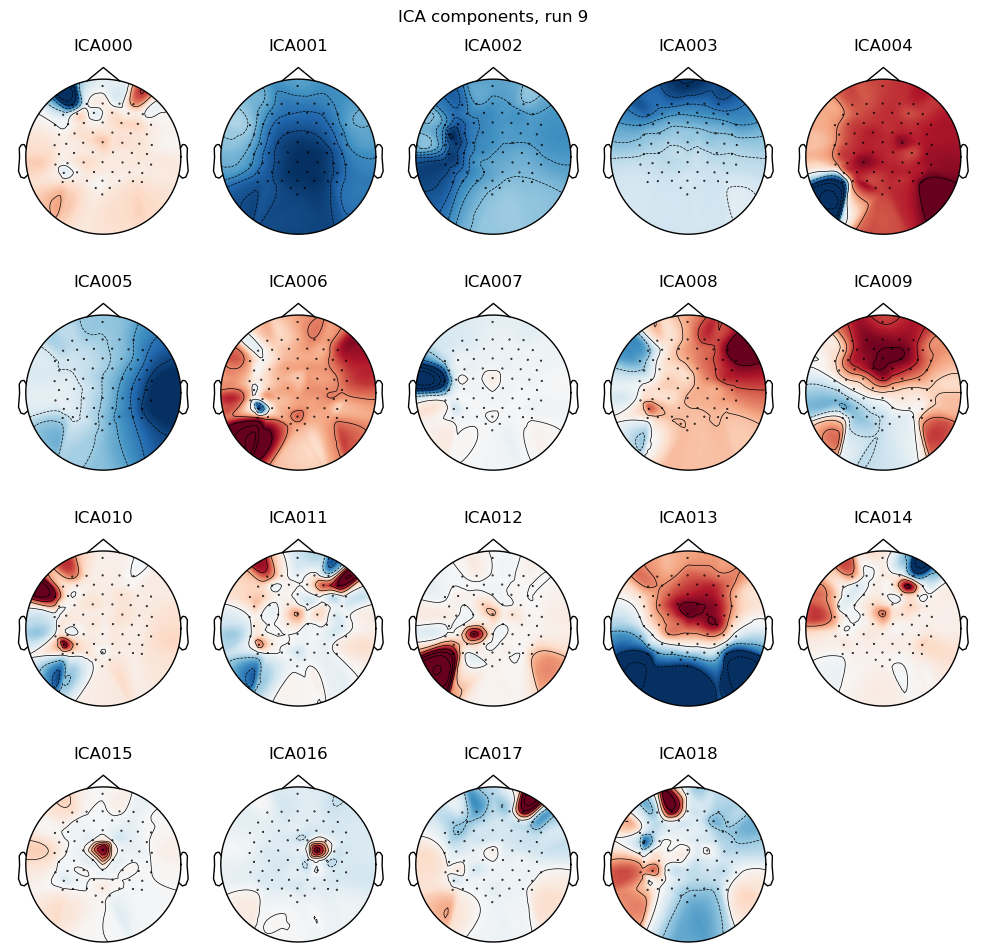

No eye movement artifacts detected for run 9.

Not setting metadata
63 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


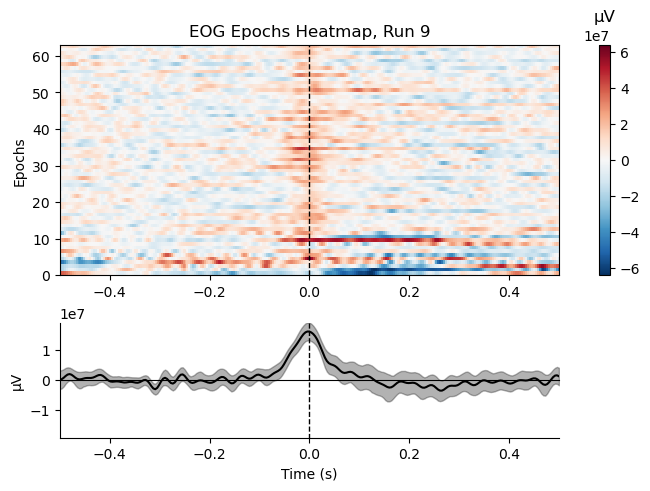

No projector specified for this dataset. Please consider the method self.add_proj.


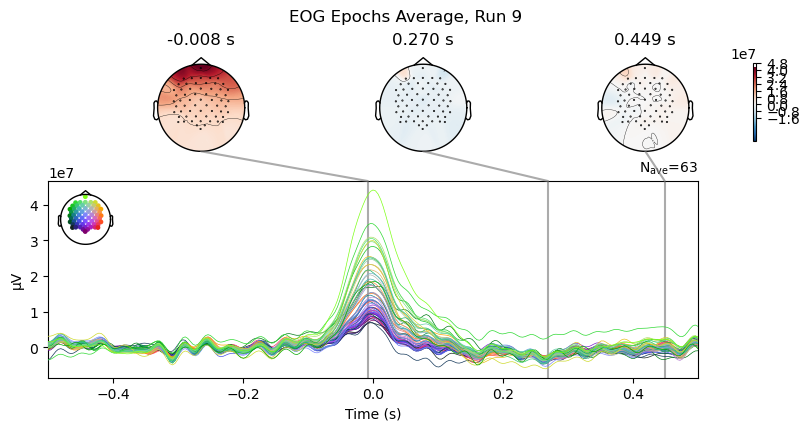

In [139]:
run = 9 - 1
ica_processor = ICAProcessor()
ica_processor.plot_component(eeg_data_p1, ica_component_p1, run)
prepare_ica_artifacts(eeg_data_p1, ica_component_p1, run, 'eye')
plot_eog_epochs(eeg_data_p1, run)

**Manual Observation**
- **Eye components**
  - component 000 is likely eye blinking

**Automatic Observation**
- **Eye components**
  - Detected component 000 as eye blinking

In [ ]:
pid = 9
ica_components[pid].exclude = [0, 7]
ica_components[pid].apply(eeg_raw_dict[pid])

Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 2 ICA components
    Projecting back using 61 PCA components


Measurement date,"September 06, 2017 08:38:45 GMT"
Experimenter,Unknown
Participant,p09
Digitized points,64 points
Good channels,"61 EEG, 3 EOG"
Bad channels,None
EOG channels,"eog-l, eog-m, eog-r"
ECG channels,Not available
Sampling frequency,256.00 Hz
Highpass,0.10 Hz
Lowpass,30.00 Hz


### Participant 2

#### Run 1

In [93]:
pid = 'P02'
eeg_data_p2 = participant_runs(eeg_ica_dict, pid)
ica_component_p2 = get_ica_components(ica_components, pid)

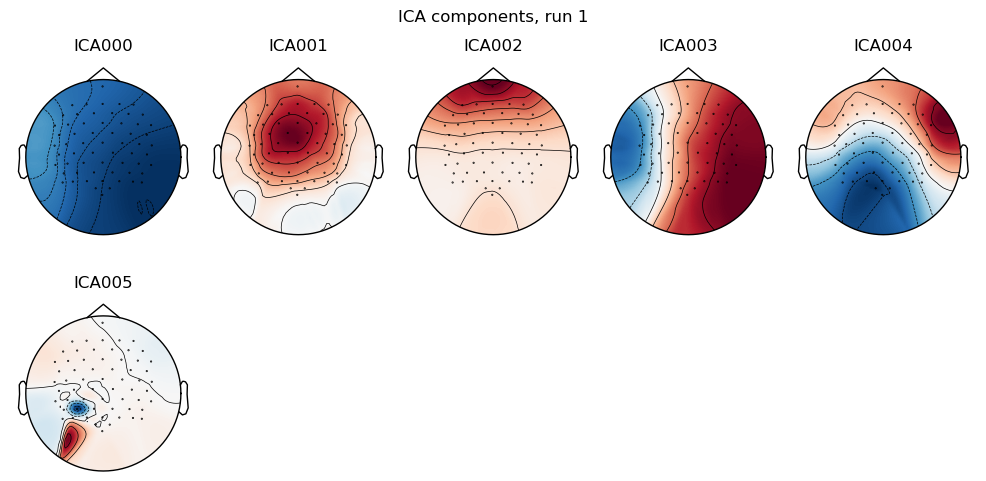

No eye movement artifacts detected for run 1.

Not setting metadata
13 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


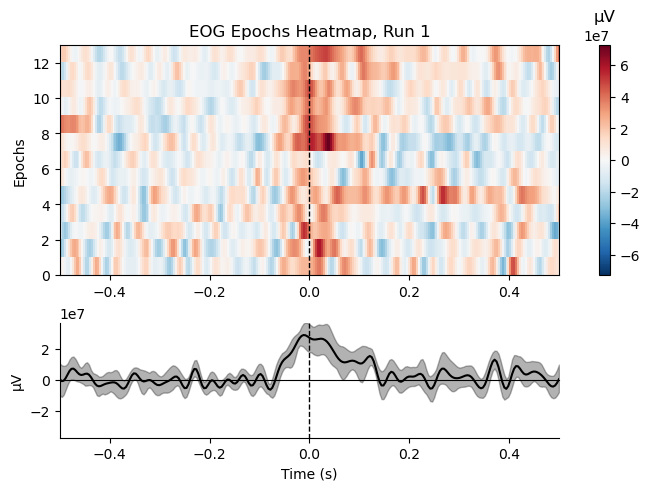

No projector specified for this dataset. Please consider the method self.add_proj.


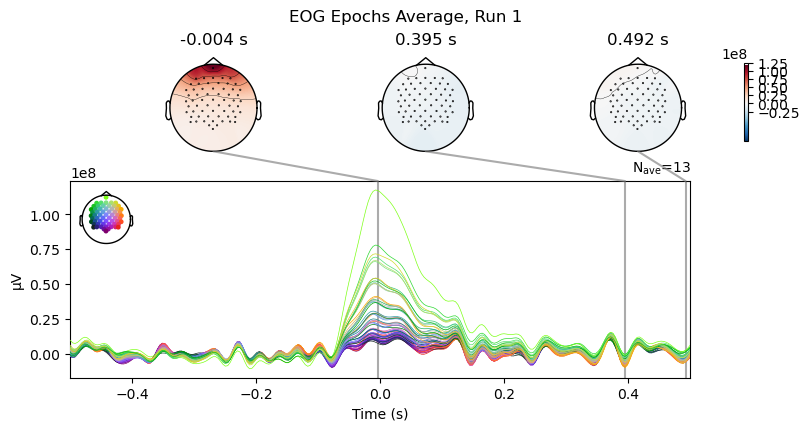

In [103]:
run = 1 - 1
ica_processor = ICAProcessor()
ica_processor.plot_component(eeg_data_p2, ica_component_p2, run)
prepare_ica_artifacts(eeg_data_p2, ica_component_p2, run, 'eye')
plot_eog_epochs(eeg_data_p2, run)

**Manual Observation**
- **Eye components**
  - component 000 is likely eye blinking
  - component 002 is likely eye blinking
  - component 004 is likely eye movements
  

**Automatic Observation**
- **Eye components**
  - None Detected

In [ ]:
pid = 10
ica_components[pid].exclude = [0, 2, 4]
ica_components[pid].apply(eeg_raw_dict[pid])

Applying ICA to Raw instance
    Transforming to ICA space (6 components)
    Zeroing out 3 ICA components
    Projecting back using 61 PCA components


Measurement date,"December 13, 2017 09:28:22 GMT"
Experimenter,Unknown
Participant,p10
Digitized points,64 points
Good channels,"61 EEG, 3 EOG"
Bad channels,None
EOG channels,"eog-l, eog-m, eog-r"
ECG channels,Not available
Sampling frequency,256.00 Hz
Highpass,0.10 Hz
Lowpass,30.00 Hz


#### Run 2

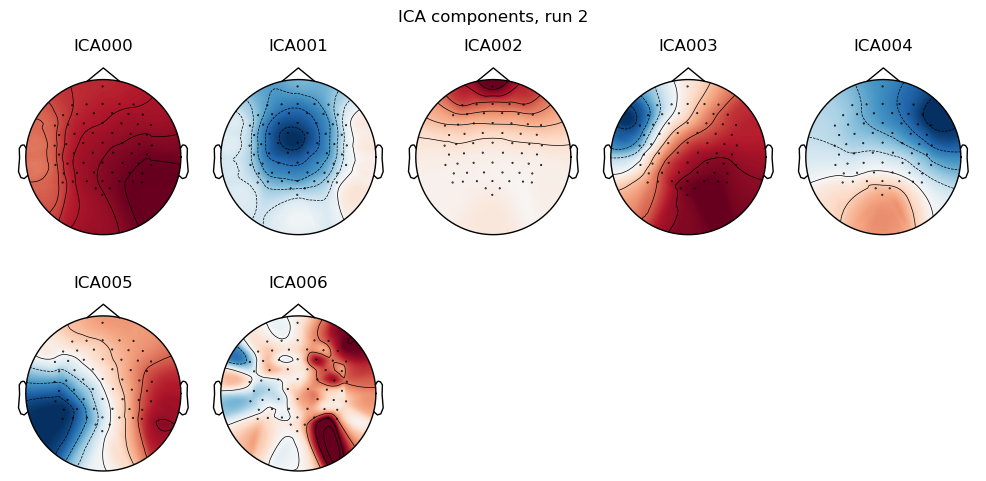

No eye movement artifacts detected for run 2.

Not setting metadata
25 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


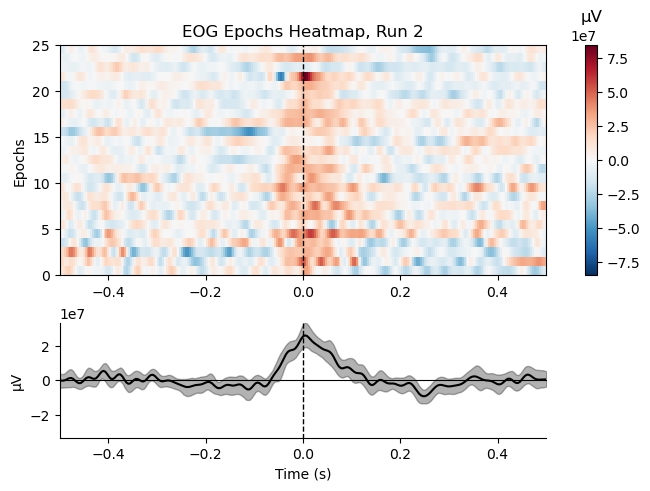

No projector specified for this dataset. Please consider the method self.add_proj.


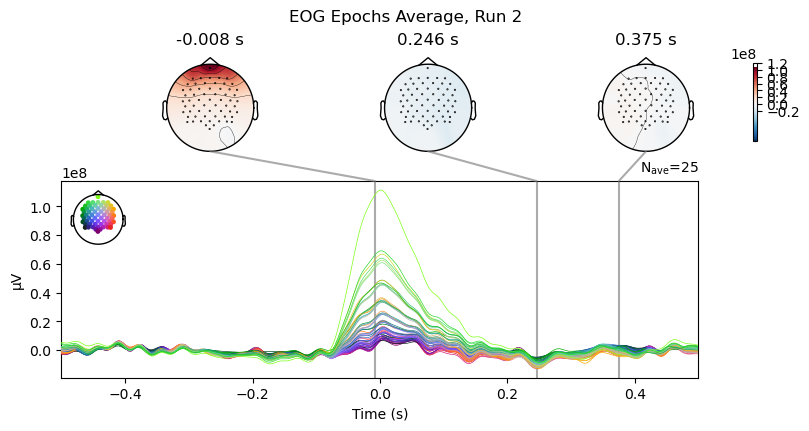

In [104]:
run = 2 - 1
ica_processor = ICAProcessor()
ica_processor.plot_component(eeg_data_p2, ica_component_p2, run)
prepare_ica_artifacts(eeg_data_p2, ica_component_p2, run, 'eye')
plot_eog_epochs(eeg_data_p2, run)

#### Run 3

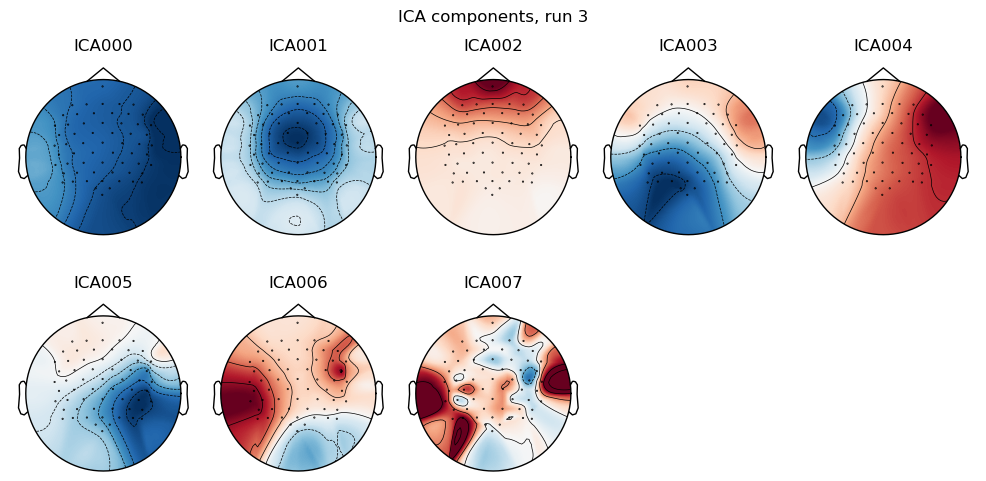

No eye movement artifacts detected for run 3.

Not setting metadata
16 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


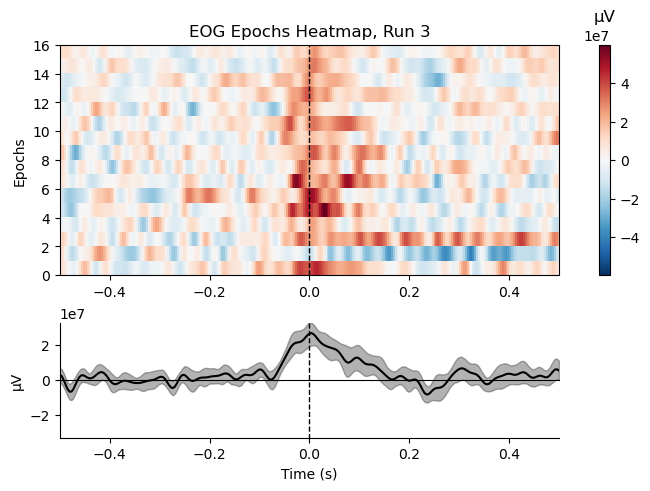

No projector specified for this dataset. Please consider the method self.add_proj.


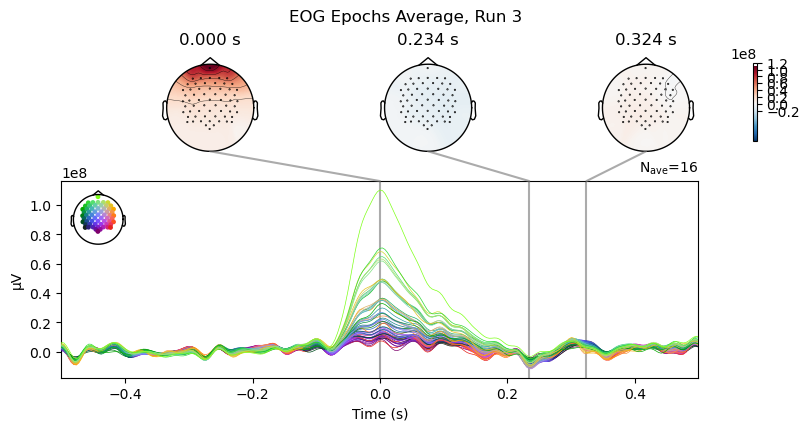

In [106]:
run = 3 - 1
ica_processor = ICAProcessor()
ica_processor.plot_component(eeg_data_p2, ica_component_p2, run)
prepare_ica_artifacts(eeg_data_p2, ica_component_p2, run, 'eye')
plot_eog_epochs(eeg_data_p2, run)

#### Run 4

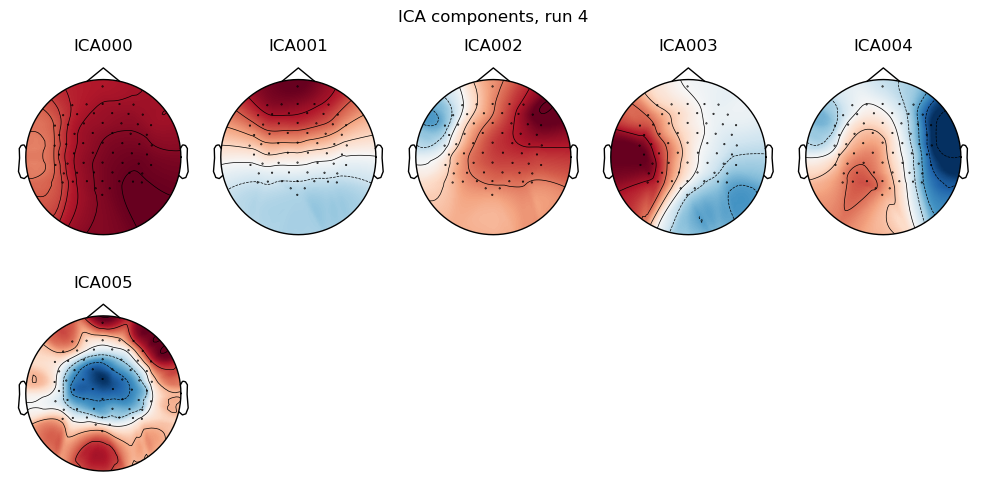

No eye movement artifacts detected for run 4.

Not setting metadata
354 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


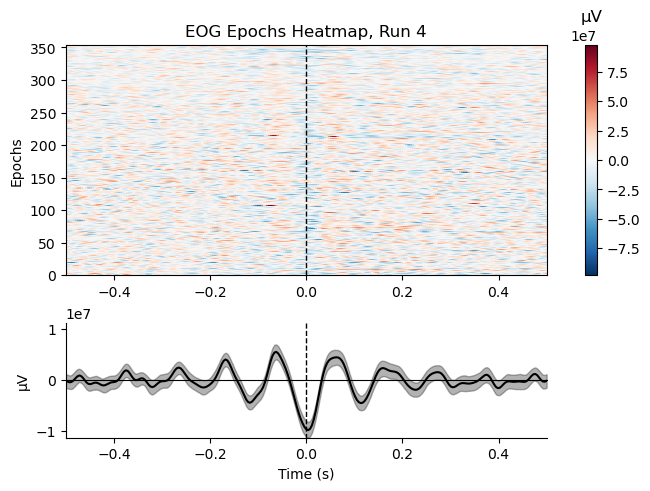

No projector specified for this dataset. Please consider the method self.add_proj.


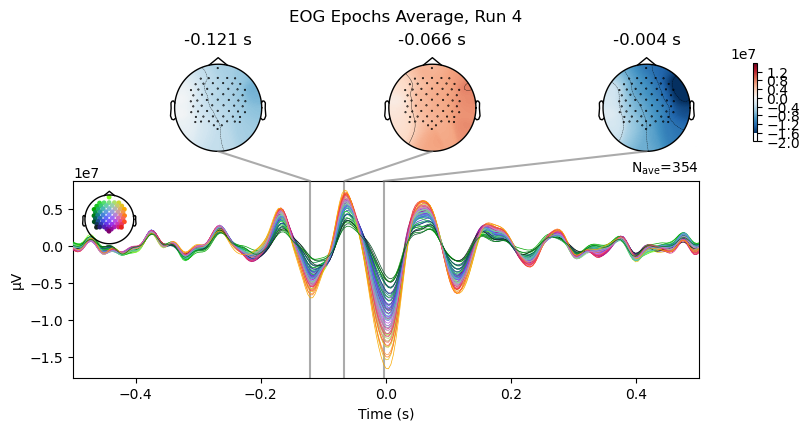

In [107]:
run = 4 - 1
ica_processor = ICAProcessor()
ica_processor.plot_component(eeg_data_p2, ica_component_p2, run)
prepare_ica_artifacts(eeg_data_p2, ica_component_p2, run, 'eye')
plot_eog_epochs(eeg_data_p2, run)

#### Run 5

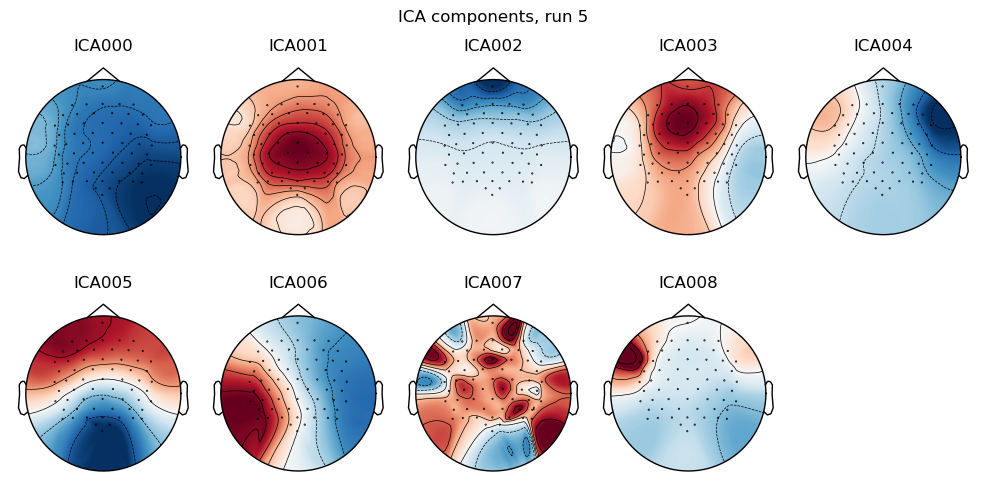

No eye movement artifacts detected for run 5.

Not setting metadata
25 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


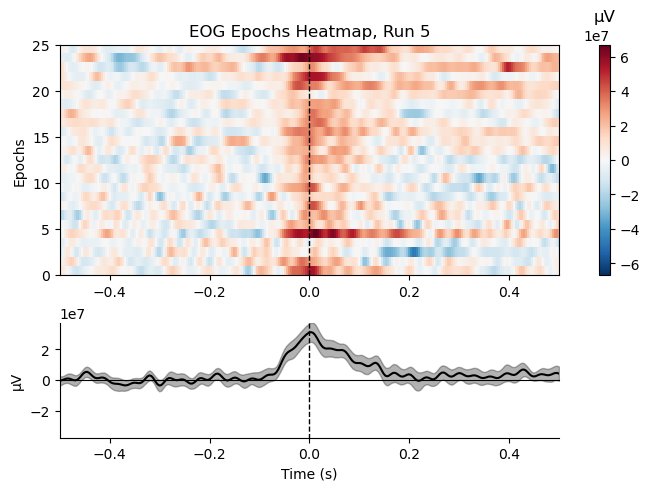

No projector specified for this dataset. Please consider the method self.add_proj.


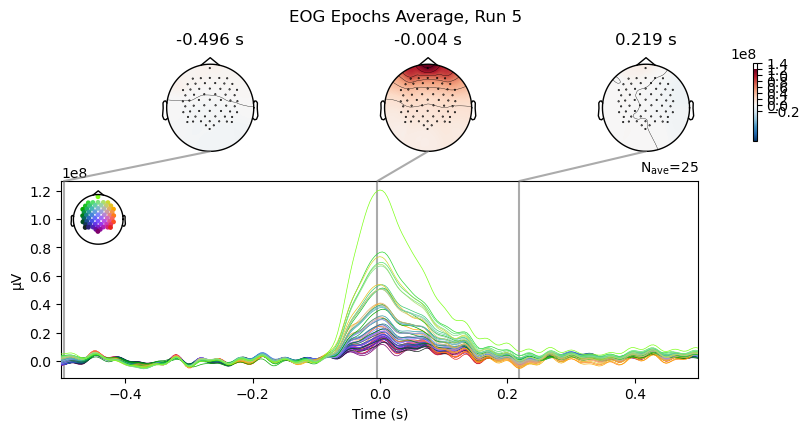

In [108]:
run = 5 - 1
ica_processor = ICAProcessor()
ica_processor.plot_component(eeg_data_p2, ica_component_p2, run)
prepare_ica_artifacts(eeg_data_p2, ica_component_p2, run, 'eye')
plot_eog_epochs(eeg_data_p2, run)

#### Run 6

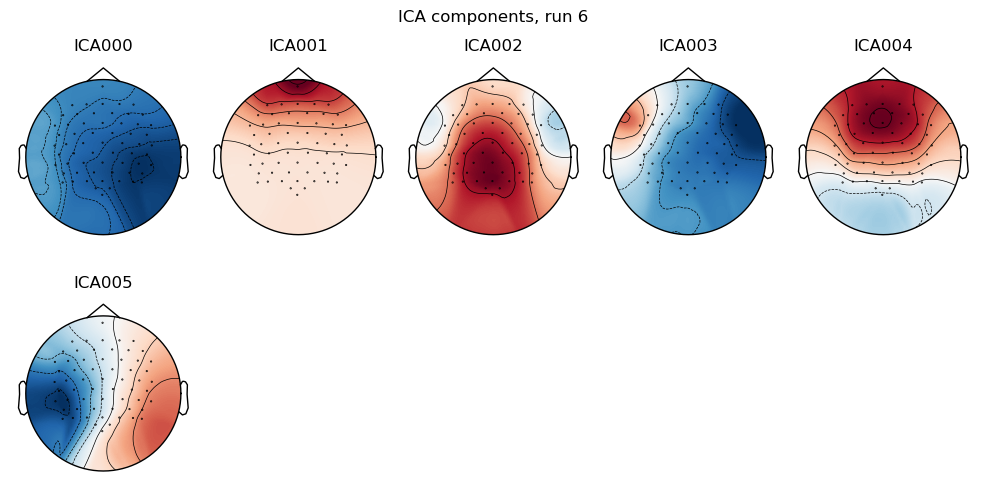

No eye movement artifacts detected for run 6.

Not setting metadata
38 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


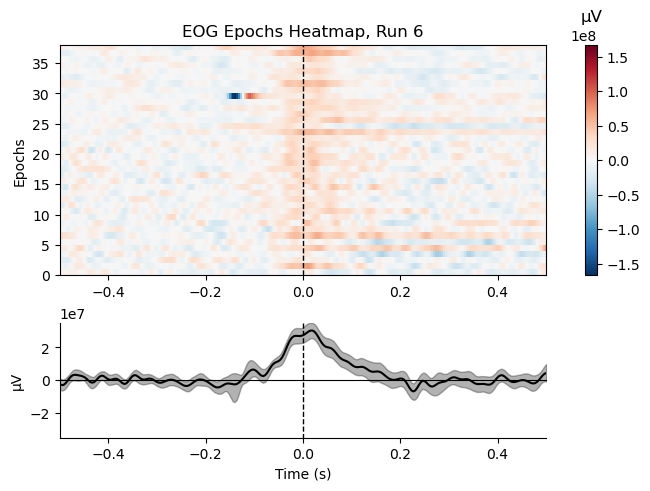

No projector specified for this dataset. Please consider the method self.add_proj.


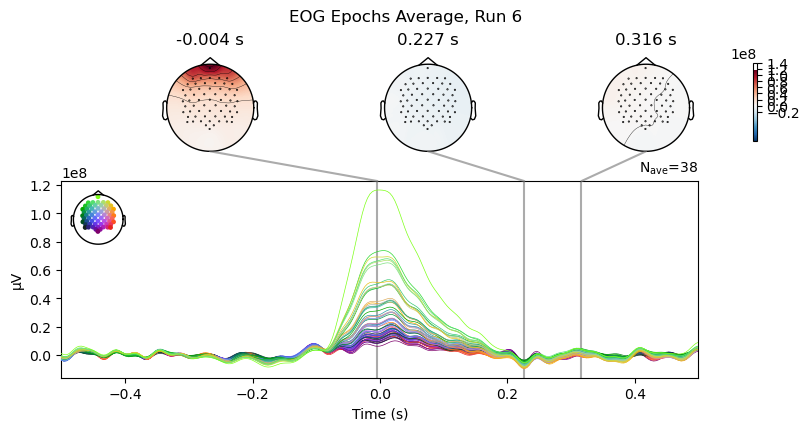

In [109]:
run = 6 - 1
ica_processor = ICAProcessor()
ica_processor.plot_component(eeg_data_p2, ica_component_p2, run)
prepare_ica_artifacts(eeg_data_p2, ica_component_p2, run, 'eye')
plot_eog_epochs(eeg_data_p2, run)

#### Run 7

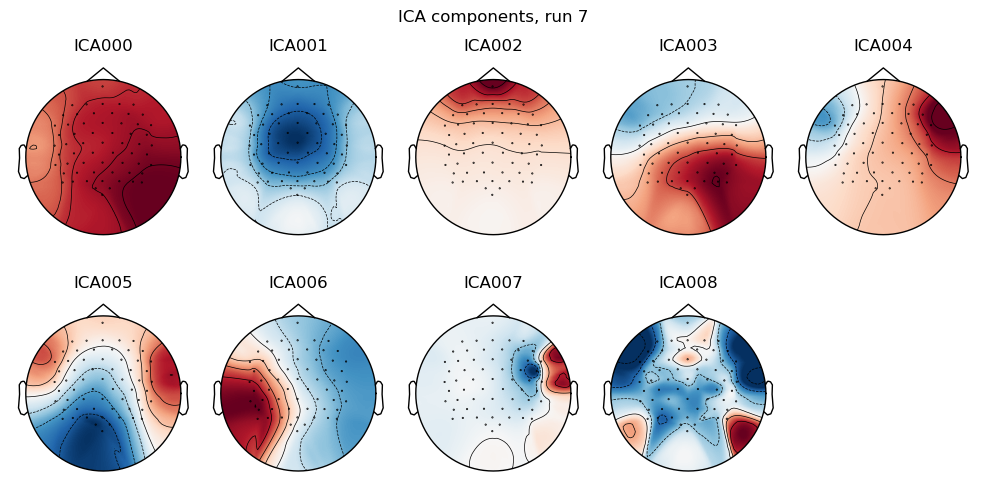

No eye movement artifacts detected for run 7.

Not setting metadata
44 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


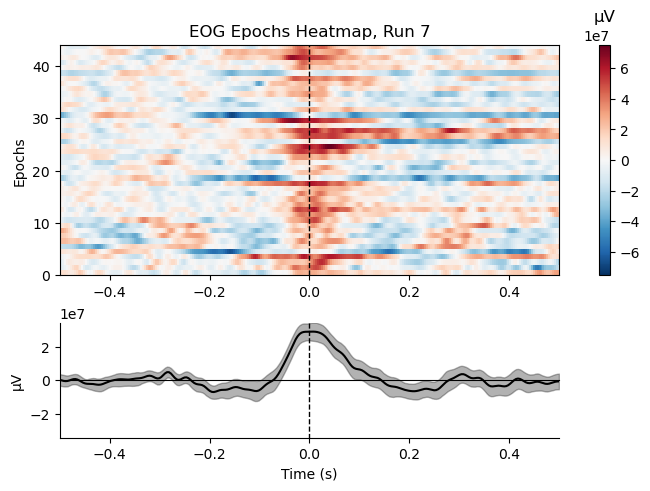

No projector specified for this dataset. Please consider the method self.add_proj.


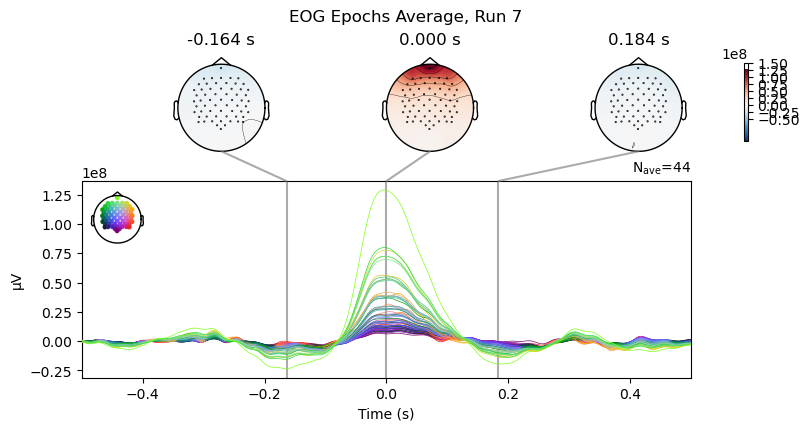

In [110]:
run = 7 - 1
ica_processor = ICAProcessor()
ica_processor.plot_component(eeg_data_p2, ica_component_p2, run)
prepare_ica_artifacts(eeg_data_p2, ica_component_p2, run, 'eye')
plot_eog_epochs(eeg_data_p2, run)

#### Run 8

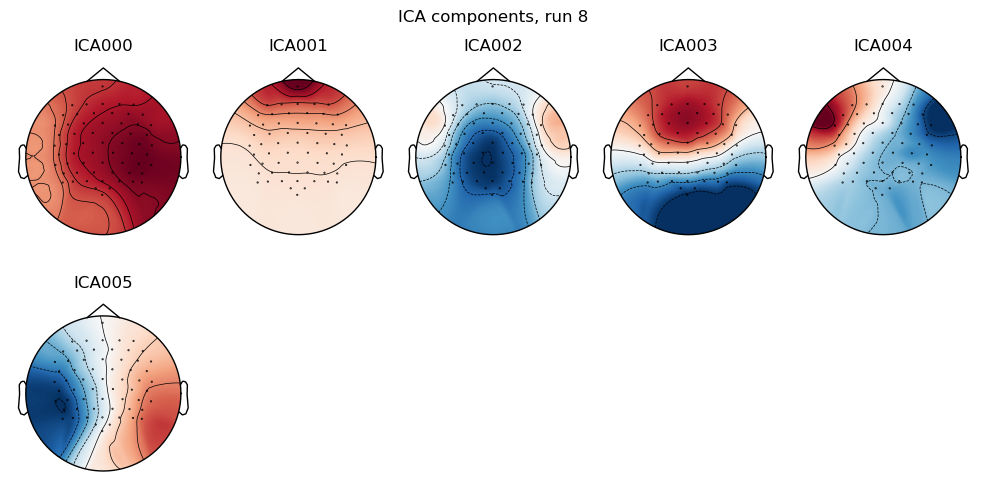

No eye movement artifacts detected for run 8.

Not setting metadata
36 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


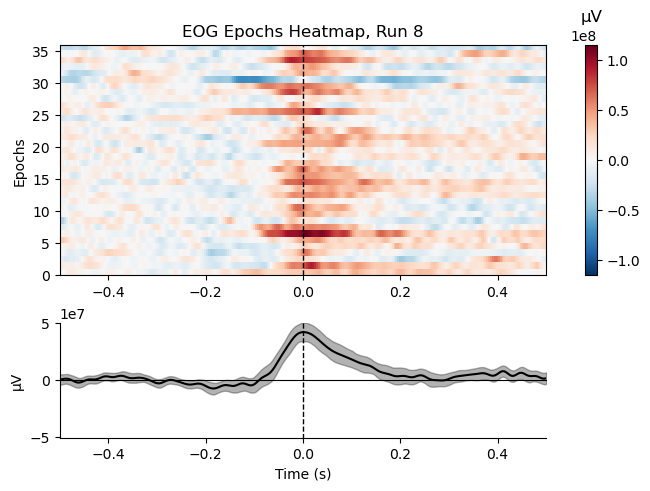

No projector specified for this dataset. Please consider the method self.add_proj.


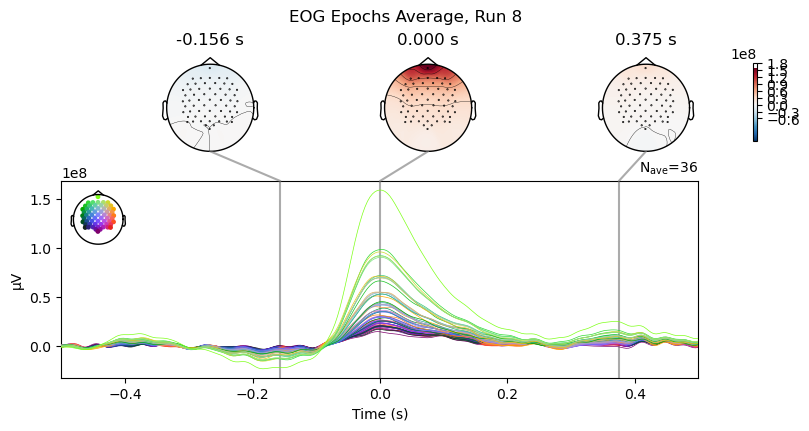

In [111]:
run = 8 - 1
ica_processor = ICAProcessor()
ica_processor.plot_component(eeg_data_p2, ica_component_p2, run)
prepare_ica_artifacts(eeg_data_p2, ica_component_p2, run, 'eye')
plot_eog_epochs(eeg_data_p2, run)

#### Run 9

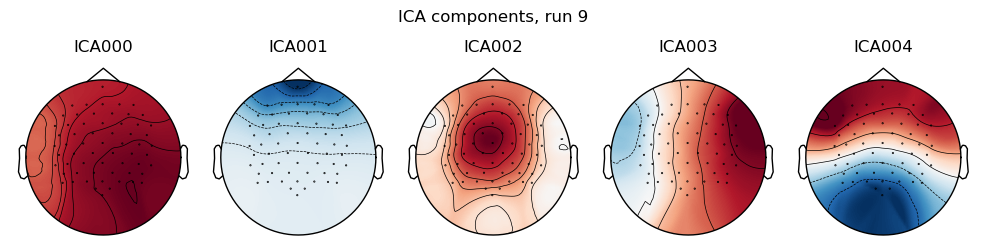

No eye movement artifacts detected for run 9.

Not setting metadata
44 matching events found
No baseline correction applied
0 projection items activated
combining channels using "mean"


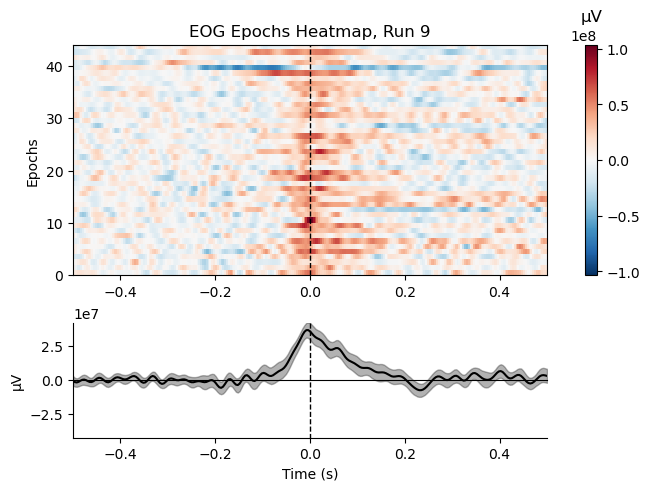

No projector specified for this dataset. Please consider the method self.add_proj.


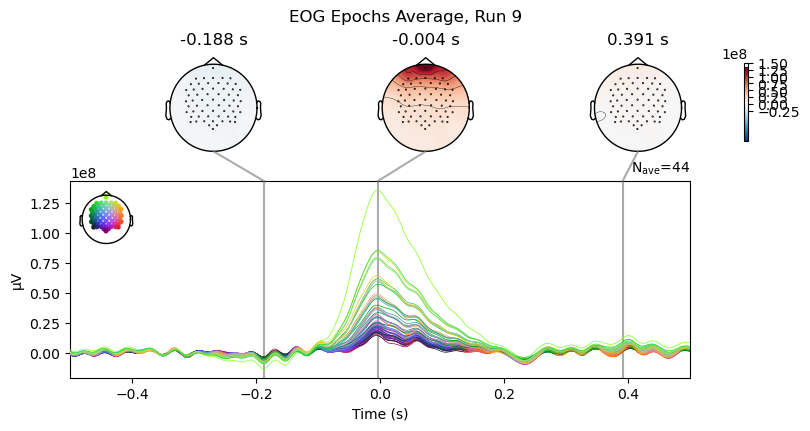

In [112]:
run = 9 - 1
ica_processor = ICAProcessor()
ica_processor.plot_component(eeg_data_p2, ica_component_p2, run)
prepare_ica_artifacts(eeg_data_p2, ica_component_p2, run, 'eye')
plot_eog_epochs(eeg_data_p2, run)

### Reference

In [ ]:
eeg_raw_dict

{1: <Raw | P01 concat raw.fif, 64 x 679572 (2654.6 s), ~331.9 MB, data loaded>,
 2: <Raw | P02 concat raw.fif, 64 x 679572 (2654.6 s), ~331.9 MB, data loaded>,
 3: <Raw | P03 concat raw.fif, 64 x 679572 (2654.6 s), ~331.9 MB, data loaded>,
 4: <Raw | P04 concat raw.fif, 64 x 679572 (2654.6 s), ~331.9 MB, data loaded>,
 5: <Raw | P05 concat raw.fif, 64 x 679572 (2654.6 s), ~331.9 MB, data loaded>,
 6: <Raw | P06 concat raw.fif, 64 x 679572 (2654.6 s), ~331.9 MB, data loaded>,
 7: <Raw | P07 concat raw.fif, 64 x 679572 (2654.6 s), ~331.9 MB, data loaded>,
 8: <Raw | P08 concat raw.fif, 64 x 679572 (2654.6 s), ~331.9 MB, data loaded>,
 9: <Raw | P09 concat raw.fif, 64 x 679572 (2654.6 s), ~331.9 MB, data loaded>,
 10: <Raw | P10 concat raw.fif, 64 x 679572 (2654.6 s), ~331.9 MB, data loaded>}

In [ ]:
def set_reference(eeg_data: dict):
  for key, value in eeg_data.items():
    value.set_eeg_reference(ref_channels='average')
    
set_reference(eeg_raw_dict)

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
E

### Epocching

In [ ]:
print(eeg_raw_dict[1].annotations)
print(eeg_raw_dict[1].annotations.duration)
print(set(eeg_raw_dict[1].annotations.description))
print('Onset', eeg_raw_dict[1].annotations.onset)

<Annotations | 2536 segments: 33536 (360), 33544 (72), 33545 (72), 33547 ...>
[0.00390625 0.00390625 0.00390625 ... 0.00390625 0.00390625 0.00390625]
{'33693', '33545', '33544', '925', '926', '33694', 'BAD boundary', '768', '785', '33554', '33547', '786', 'EDGE boundary', '779', '776', '777', '33536'}
Onset [  10.         10.         10.       ... 2648.710938 2648.710938
 2648.710938]


In [ ]:
events, event_id = events_from_annotations(eeg_raw_dict[1])
print("EVENTS", events)
print(event_id)

Used Annotations descriptions: ['33536', '33544', '33545', '33547', '33554', '33693', '33694', '768', '776', '777', '779', '785', '786', '925', '926']
EVENTS [[  2560      0      8]
 [  2560      0     12]
 [  2560      0     13]
 ...
 [678070      0      1]
 [678070      0      5]
 [678070      0      6]]
{'33536': 1, '33544': 2, '33545': 3, '33547': 4, '33554': 5, '33693': 6, '33694': 7, '768': 8, '776': 9, '777': 10, '779': 11, '785': 12, '786': 13, '925': 14, '926': 15}


In [ ]:
events.shape

(2520, 3)

In [ ]:
# Define the event codes you want to exclude
desired_event_ids = [9, 10, 11, 14, 15]
filtered_events = [event for event in events if event[2] in desired_event_ids]
filtered_events = np.array(filtered_events)
filtered_events.shape

(360, 3)

In [ ]:
desired_event_ids = [9, 10, 11, 14, 15]
filtered_event_ids = {key: value for key, value in event_id.items() if value in desired_event_ids}
print(filtered_event_ids)

{'776': 9, '777': 10, '779': 11, '925': 14, '926': 15}


##### Segmenting data

In [ ]:
raw = eeg_raw_dict[1]

tmin, tmax = -1, 3  
baseline = (-1, 0) 
reject_criteria = dict(eeg=100e-6)
flat_criteria = dict(eeg=1e-6)

# Create epochs with the event_repeated parameter
epochs = mne.Epochs(raw, 
                    filtered_events, 
                    filtered_event_ids, 
                    tmin, 
                    tmax, 
                    baseline=baseline, 
                    reject=reject_criteria, 
                    flat=flat_criteria, 
                    reject_by_annotation=True,
                    preload=True)


Not setting metadata
360 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 360 events and 1025 original time points ...
    Rejecting  epoch based on EEG : ['AFz', 'F3', 'F1', 'Fz', 'F2', 'F4', 'FFC5h', 'FFC3h', 'FFC1h', 'FFC2h', 'FFC4h', 'FFC6h', 'FC5', 'FC3', 'FC1', 'FCz', 'FC2', 'FC4', 'FC6', 'FCC5h', 'FCC3h', 'FCC1h', 'FCC2h', 'FCC4h', 'FCC6h', 'C5', 'C3', 'C1', 'Cz', 'C2', 'C4', 'C6', 'CCP5h', 'CCP3h', 'CCP1h', 'CCP2h', 'CCP4h', 'CCP6h', 'CP5', 'CP3', 'CP1', 'CPz', 'CP2', 'CP4', 'CP6', 'CPP5h', 'CPP3h', 'CPP1h', 'CPP2h', 'CPP4h', 'CPP6h', 'P5', 'P3', 'P1', 'Pz', 'P2', 'P4', 'P6', 'PPO1h', 'PPO2h', 'POz']
    Rejecting  epoch based on EEG : ['AFz', 'F3', 'F1', 'Fz', 'F2', 'F4', 'FFC5h', 'FFC3h', 'FFC1h', 'FFC2h', 'FFC4h', 'FFC6h', 'FC5', 'FC3', 'FC1', 'FCz', 'FC2', 'FC4', 'FC6', 'FCC5h', 'FCC3h', 'FCC1h', 'FCC2h', 'FCC4h', 'FCC6h', 'C5', 'C3', 'C1', 'Cz', 'C2', 'C4', 'C6', 'CCP5h', 'CCP3h', 'CCP1h', 'CCP2h

/var/folders/0h/5yv3vz210dx61dfqmldvk_h40000gn/T/ipykernel_92961/1733429497.py:9: RuntimeWarning: All epochs were dropped!
You might need to alter reject/flat-criteria or drop bad channels to avoid this. You can use Epochs.plot_drop_log() to see which channels are responsible for the dropping of epochs.
  epochs = mne.Epochs(raw,


In [ ]:
print(epochs.drop_log)

(('AFz', 'F3', 'F1', 'Fz', 'F2', 'F4', 'FFC5h', 'FFC3h', 'FFC1h', 'FFC2h', 'FFC4h', 'FFC6h', 'FC5', 'FC3', 'FC1', 'FCz', 'FC2', 'FC4', 'FC6', 'FCC5h', 'FCC3h', 'FCC1h', 'FCC2h', 'FCC4h', 'FCC6h', 'C5', 'C3', 'C1', 'Cz', 'C2', 'C4', 'C6', 'CCP5h', 'CCP3h', 'CCP1h', 'CCP2h', 'CCP4h', 'CCP6h', 'CP5', 'CP3', 'CP1', 'CPz', 'CP2', 'CP4', 'CP6', 'CPP5h', 'CPP3h', 'CPP1h', 'CPP2h', 'CPP4h', 'CPP6h', 'P5', 'P3', 'P1', 'Pz', 'P2', 'P4', 'P6', 'PPO1h', 'PPO2h', 'POz'), ('AFz', 'F3', 'F1', 'Fz', 'F2', 'F4', 'FFC5h', 'FFC3h', 'FFC1h', 'FFC2h', 'FFC4h', 'FFC6h', 'FC5', 'FC3', 'FC1', 'FCz', 'FC2', 'FC4', 'FC6', 'FCC5h', 'FCC3h', 'FCC1h', 'FCC2h', 'FCC4h', 'FCC6h', 'C5', 'C3', 'C1', 'Cz', 'C2', 'C4', 'C6', 'CCP5h', 'CCP3h', 'CCP1h', 'CCP2h', 'CCP4h', 'CCP6h', 'CP5', 'CP3', 'CP1', 'CPz', 'CP2', 'CP4', 'CP6', 'CPP5h', 'CPP3h', 'CPP1h', 'CPP2h', 'CPP4h', 'CPP6h', 'P5', 'P3', 'P1', 'Pz', 'P2', 'P4', 'P6', 'PPO1h', 'PPO2h', 'POz'), ('AFz', 'F3', 'F1', 'Fz', 'F2', 'F4', 'FFC5h', 'FFC3h', 'FFC1h', 'FFC2h', '

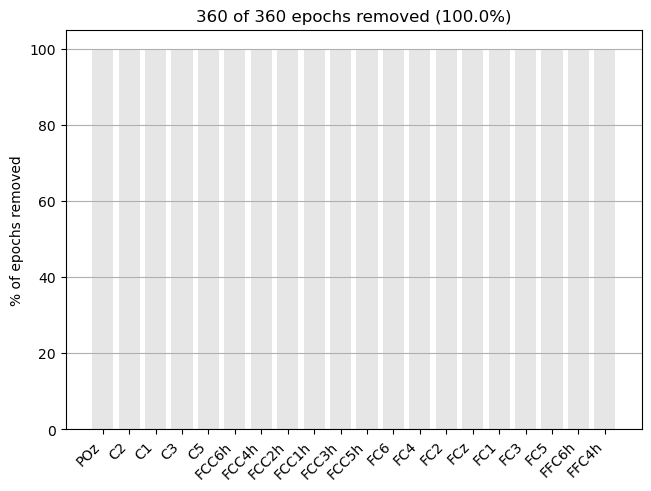

In [ ]:
# print(epochs.drop_log)
epochs.plot_drop_log()
plt.show()

In [ ]:
unique_event_codes = set(events[:, -1])
print("Unique event codes:", unique_event_codes)

In [ ]:
hexa_dec = [{"event_code": "0x300", "event_description": "trial start"}, 
            {"event_code": "0x311", "event_description": "beep"}, 
            {"event_code": "0x312", "event_description": "fixation cross"}, 
            {"event_code": "0x308", "event_description": "supination class cue"}, 
            {"event_code": "0x309", "event_description": "pronation class cue"}, 
            {"event_code": "0x30B", "event_description": "hand open class cue"}, 
            {"event_code": "0x39D", "event_description": "palmar grasp class cue"}, 
            {"event_code": "0x39E", "event_description": "lateral grasp class cue"}]
# def hexadecimal_to_decimal(hexadec):
#   return int(hexadec, 16)

for i in hexa_dec:
  print(i['event_code'], int(i['event_code'], 16), i['event_description'])

0x300 768 trial start
0x311 785 beep
0x312 786 fixation cross
0x308 776 supination class cue
0x309 777 pronation class cue
0x30B 779 hand open class cue
0x39D 925 palmar grasp class cue
0x39E 926 lateral grasp class cue


In [ ]:
rawEEG.plot(title='Raw EEG Data', block=True, scalings='50.0',
            picks='all', color='black',
          )
plt.show()

After inspecting the plot we see that the following arent EEG channels: 
- 'thumb_near', 'thumb_far', 'thumb_index', 'index_near', 
- 'index_far', 'index_middle', 'middle_near', 'middle_far', 
- 'middle_ring', 'ring_near', 'ring_far', 'ring_little', 
- 'litte_near', 'litte_far', 'thumb_palm', 'wrist_bend', 
- 'roll', 'pitch', 'gesture', 'button_press'
<br><br>
and thus we will filter them out from the channel list

  

#### Filtering out Non Channel Entries for plotting

In [ ]:
non_channel_entries = ['thumb_near', 'thumb_far', 'thumb_index', 'index_near', 
                       'index_far', 'index_middle', 'middle_near', 'middle_far', 
                       'middle_ring', 'ring_near', 'ring_far', 'ring_little', 
                       'litte_near', 'litte_far', 'thumb_palm', 'wrist_bend', 
                       'roll', 'pitch', 'gesture', 'button_press']

eeg_channels_filtered = [channel for channel in rawEEG.info['ch_names'] if channel not in non_channel_entries]

print(eeg_channels_filtered, len(eeg_channels_filtered))


In [ ]:
rawEEG.plot(title='Raw EEG Data', block=True, scalings='50.0',
            picks=eeg_channels_filtered, color='black',
          )
plt.show()

In [ ]:
rawEEGDropChn = rawEEG.copy()
rawEEGDropChn.drop_channels(non_channel_entries)

- Channels that were'nt really channels are dropped
- The total amount of missing values has decreased from 459069 to 16192
- The new shape of the data is (64, 23296) 

In [ ]:
rawEEGDropChn.plot(title='Raw EEG Data', block=True, scalings='100.0',
            picks='all', color='black',
          )
plt.show()

In [ ]:
rawEEGDropChn.compute_psd().plot(amplitude=True)

In [ ]:
montage = mne.channels.make_standard_montage('standard_1005')
rawEEGDropChn.set_montage(montage)

In [ ]:
rawEEGDropChn.plot_sensors(ch_type='eeg', show_names=True)

Plot channel-wise frequencies spectra as topography

In [ ]:
rawEEGDropChn.compute_psd().plot_topo()